# ProbComp Localization Tutorial

This notebook aims to give an introduction to probabilistic computation (ProbComp).  This term refers to a way of expressing probabilistic constructs in a computational paradigm, made precise by a probablistic programming language (PPL).  The programmer can thus encode their probabilistic intuition for solving a problem into an algorithm.  Back-end language work automates the routine but error-prone derivations.

In [1]:
# Global setup code

# The dependencies consist of the following Juila packages.
using Dates: now, value
using JSON: parsefile
using Plots
using Gen

# Ensure a location for image generation.
mkpath("imgs");

## The "real world"

We assume given
* a map of a space, together with
* some clutters that sometimes unexpectedly exist in that space.

We also assume given a description of a robot's behavior via
* an estimated initial pose (= position + heading), and
* a program of controls (= advance distance, followed by rotate heading).

*In addition to the uncertainty in the initial pose, we are uncertain about the true execution of the motion of the robot.*

Below, we will also introduce sensors.

### Load map and robot data

Generally speaking, we keep general code and specific examples in separate cells, as signposted here.

In [2]:
# General code here

norm(v :: Vector{Float64}) = sqrt(sum(v.^2))

struct Segment
    p1 :: Vector{Float64}
    p2 :: Vector{Float64}
    dp :: Vector{Float64}
    Segment(p1 :: Vector{Float64}, p2 :: Vector{Float64}) = new(p1, p2, p2-p1)
end
Base.show(io :: IO, s :: Segment) = Base.show(io, "Segment($(s.p1), $(s.p2))")

struct Pose
    p  :: Vector{Float64}
    hd :: Float64
    dp :: Vector{Float64}
    Pose(p :: Vector{Float64}, hd :: Float64) = new(p, rem2pi(hd, RoundNearest), [cos(hd), sin(hd)])
end
Pose(p :: Vector{Float64}, dp :: Vector{Float64}) = Pose(p, atan(dp[2], dp[1]))
Base.show(io :: IO, p :: Pose) = Base.show(io, "Pose($(p.p), $(p.hd))")

step_along_pose(p :: Pose, s :: Float64) :: Vector{Float64} = p.p + s * p.dp
rotate_pose(p :: Pose, a :: Float64) :: Pose = Pose(p.p, p.hd + a)

Segment(p1 :: Pose, p2 :: Pose) = Segment(p1.p, p2.p)

# A value `c :: Control` corresponds to the robot *first* advancing in its present direction by `c.ds`, *then* rotating by `c.dhd`.
struct Control
    ds  :: Float64
    dhd :: Float64
end

function create_segments(verts :: Vector{Vector{Float64}}; loop_around=false) :: Vector{Segment}
    segs = [Segment(p1, p2) for (p1, p2) in zip(verts[1:end-1], verts[2:end])]
    if loop_around; push!(segs, Segment(verts[end], verts[1])) end
    return segs
end

function make_world(walls_vec :: Vector{Vector{Float64}}, clutters_vec :: Vector{Vector{Vector{Float64}}},
                    start :: Pose, controls :: Vector{Control}; loop_around=false)
    walls = create_segments(walls_vec; loop_around=loop_around)
    clutters = [create_segments(clutter; loop_around=loop_around) for clutter in clutters_vec]
    walls_clutters = [walls ; clutters...]
    all_points = [walls_vec ; clutters_vec... ; [start.p]]
    x_min = minimum(p[1] for p in all_points)
    x_max = maximum(p[1] for p in all_points)
    y_min = minimum(p[2] for p in all_points)
    y_max = maximum(p[2] for p in all_points)
    bounding_box = (x_min, x_max, y_min, y_max)
    box_size = max(x_max - x_min, y_max - y_min)
    center_point = [(x_min + x_max) / 2.0, (y_min + y_max) / 2.0]
    T = length(controls)
    return (walls=walls, clutters=clutters, walls_clutters=walls_clutters,
            bounding_box=bounding_box, box_size=box_size, center_point=center_point),
           (start=start, controls=controls),
           T
end

function load_world(file_name; loop_around=false)
    data = parsefile(file_name)
    walls_vec = Vector{Vector{Float64}}(data["wall_verts"])
    clutters_vec = Vector{Vector{Vector{Float64}}}(data["clutter_vert_groups"])
    start = Pose(Vector{Float64}(data["start_pose"]["p"]), Float64(data["start_pose"]["hd"]))
    controls = Vector{Control}([Control(control["ds"], control["dhd"]) for control in data["program_controls"]])
    return make_world(walls_vec, clutters_vec, start, controls; loop_around=loop_around)
end;

In [3]:
# Specific example code here

world, robot_inputs, T = load_world("example_20_program.json");

### Integrate a path from a starting pose and controls

If the motion of the robot is determined in an ideal manner by the controls, then we may simply integrate to determine the resulting path.  Naïvely, this results in the following.

In [4]:
function integrate_controls_unphysical(robot_inputs :: NamedTuple) :: Vector{Pose}
    path = Vector{Pose}(undef, length(robot_inputs.controls) + 1)
    path[1] = robot_inputs.start
    for t in 1:length(robot_inputs.controls)
        p = path[t].p + robot_inputs.controls[t].ds * path[t].dp
        hd = path[t].hd + robot_inputs.controls[t].dhd
        path[t+1] = Pose(p, hd)
    end
    return path
end;

This code has the problem that it is **unphysical**: the walls in no way constrain the robot motion.

We employ the following simple physics: when the robot's forward step through a control comes into contact with a wall, that step is interrupted and the robot instead "bounces" a fixed distance from the point of contact in the normal direction to the wall.

In [5]:
# Return unique s, t such that p + s*u == q + t*v.
function solve_lines(p :: Vector{Float64}, u :: Vector{Float64}, q :: Vector{Float64}, v :: Vector{Float64}; PARALLEL_TOL=1.0e-10)
    det = u[1] * v[2] - u[2] * v[1]
    if abs(det) < PARALLEL_TOL
        return nothing, nothing
    else
        s = (v[1] * (p[2]-q[2]) - v[2] * (p[1]-q[1])) / det
        t = (u[2] * (q[1]-p[1]) - u[1] * (q[2]-p[2])) / det
        return s, t
    end
end

function distance(p :: Pose, seg :: Segment) :: Float64
    s, t = solve_lines(p.p, p.dp, seg.p1, seg.dp)
    # Solving failed (including, by fiat, if pose is parallel to segment) iff isnothing(s).
    # Pose is oriented away from segment iff s < 0.
    # Point of intersection lies on segment (as opposed to the infinite line) iff 0 <= t <= 1.
    return (isnothing(s) || s < 0. || !(0. <= t <= 1.)) ? Inf : s
end

function physical_step(p1 :: Vector{Float64}, p2 :: Vector{Float64}, hd :: Float64, world_inputs :: NamedTuple) :: Pose
    step_pose = Pose(p1, p2 - p1)
    (s, i) = findmin(w -> distance(step_pose, w), world_inputs.walls)
    if s > norm(p2 - p1)
        # Step succeeds without contact with walls.
        return Pose(p2, hd)
    else
        contact_point = p1 + s * step_pose.dp
        unit_tangent = world_inputs.walls[i].dp / norm(world_inputs.walls[i].dp)
        unit_normal = [-unit_tangent[2], unit_tangent[1]]
        # Sign of 2D cross product determines orientation of bounce.
        if step_pose.dp[1] * world_inputs.walls[i].dp[2] - step_pose.dp[2] * world_inputs.walls[i].dp[1] < 0.
            unit_normal = -unit_normal
        end
        return Pose(contact_point + world_inputs.bounce * unit_normal, hd)
    end
end

function integrate_controls(robot_inputs :: NamedTuple, world_inputs :: NamedTuple)
    path = Vector{Pose}(undef, length(robot_inputs.controls) + 1)
    path[1] = robot_inputs.start
    for t in 1:length(robot_inputs.controls)
        p = path[t].p + robot_inputs.controls[t].ds * path[t].dp
        hd = path[t].hd + robot_inputs.controls[t].dhd
        path[t+1] = physical_step(path[t].p, p, hd, world_inputs)
    end
    return path
end;

In [6]:
# How bouncy the walls are in this world.
world_inputs = (walls = world.walls, bounce = 0.1)

path_integrated = integrate_controls(robot_inputs, world_inputs);

### Plot such data

In [7]:
function plot_list!(list; label=nothing, args...)
    if isempty(list); return end
    plt = plot!(list[1]; label=label, args...)
    for item in list[2:end]; plot!(item; label=nothing, args...) end
    return plt
end

Plots.plot!(seg :: Segment; args...) = plot!([seg.p1[1], seg.p2[1]], [seg.p1[2], seg.p2[2]]; args...)
Plots.plot!(segs :: Vector{Segment}; args...) = plot_list!(segs; args...)
Plots.plot!(seg_groups :: Vector{Vector{Segment}}; args...) = plot_list!(seg_groups; args...)

Plots.plot!(p :: Pose; r=0.5, args...) = plot!(Segment(p.p, step_along_pose(p, r)); arrow=true, args...)
Plots.plot!(ps :: Vector{Pose}; args...) = plot_list!(ps; args...)

function plot_world(world, title; label_world=false, show_clutters=false)
    border = world.box_size * (3.)/19.
    the_plot = plot(
        size         = (500, 500),
        aspect_ratio = :equal,
        grid         = false,
        xlim         = (world.bounding_box[1]-border, world.bounding_box[2]+border),
        ylim         = (world.bounding_box[3]-border, world.bounding_box[4]+border),
        title        = title,
        legend       = :bottomleft)
    (walls_label, clutter_label) = label_world ? ("walls", "clutters") : (nothing, nothing)
    plot!(world.walls; c=:black, label=walls_label)
    if show_clutters; plot!(world.clutters; c=:magenta, label=clutter_label) end
    return the_plot
end;

Following this initial display of the given data, we *suppress the clutters* until much later in the notebook.

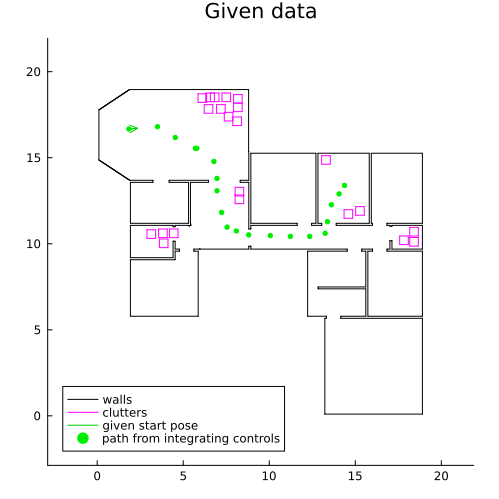

In [8]:
the_plot = plot_world(world, "Given data", label_world=true, show_clutters=true)
plot!(robot_inputs.start; color=:green3, label="given start pose")
plot!([pose.p[1] for pose in path_integrated], [pose.p[2] for pose in path_integrated];
      color=:green2, label="path from integrating controls", seriestype=:scatter, markersize=3, markerstrokewidth=0)
savefig("imgs/given_data")
the_plot

We can also visualize the behavior of the model of physical motion:

![](imgs_stable/physical_motion.gif)

## Gen basics

As said initially, we are uncertain about the true initial position and subsequent motion of the robot.  In order to reason about these, we now specify a model using `Gen`.

Each piece of the model is declared as a *generative function* (GF).  The `Gen` library provides two DSLs for constructing GFs: the dynamic DSL using the decorator `@gen` on a function declaration, and the static DSL similarly decorated with `@gen (static)`.  The dynamic DSL allows a rather wide class of program structures, whereas the static DSL only allows those for which a certain static analysis may be performed.

The library offers two basic constructs for use within these DSLs: primitive *distributions* such as "Bernoulli" and "normal", and the sampling operator `~`.  Recursively, GFs may sample from other GFs using `~`.

### Components of the motion model

We start with the two building blocks: the starting pose and individual steps of motion.

In [9]:
@gen (static) function start_pose_prior(start :: Pose, motion_settings :: NamedTuple) :: Pose
    p ~ mvnormal(start.p, motion_settings.p_noise^2 * [1 0 ; 0 1])
    hd ~ normal(start.hd, motion_settings.hd_noise)
    return Pose(p, hd)
end

@gen (static) function step_model(start :: Pose, c :: Control, world_inputs :: NamedTuple, motion_settings :: NamedTuple) :: Pose
    p ~ mvnormal(start.p + c.ds * start.dp, motion_settings.p_noise^2 * [1 0 ; 0 1])
    hd ~ normal(start.hd + c.dhd, motion_settings.hd_noise)
    return physical_step(start.p, p, hd, world_inputs)
end;

Returning to the code, we can call a GF like a normal function and it will just run stochastically:

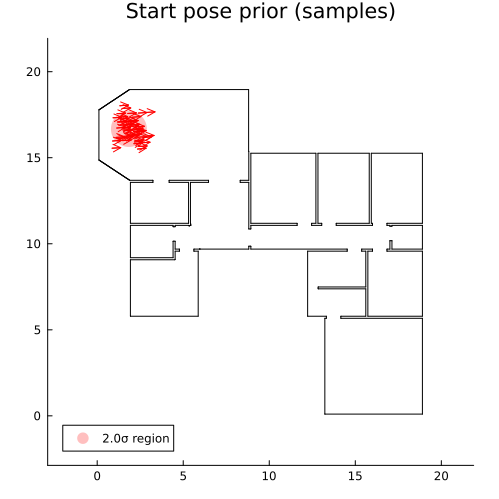

In [10]:
motion_settings = (p_noise = 0.5, hd_noise = 2π / 360)

N_samples = 50
pose_samples = [start_pose_prior(robot_inputs.start, motion_settings) for _ in 1:N_samples]

std_devs_radius = 2.

the_plot = plot_world(world, "Start pose prior (samples)")
plot!([robot_inputs.start.p[1]], [robot_inputs.start.p[2]];
      color=:red, label="$(round(std_devs_radius, digits=2))σ region", seriestype=:scatter,
      markersize=(20. * std_devs_radius * motion_settings.p_noise), markerstrokewidth=0, alpha=0.25)
plot!(pose_samples; color=:red, label=nothing)
savefig("imgs/start_prior")
the_plot

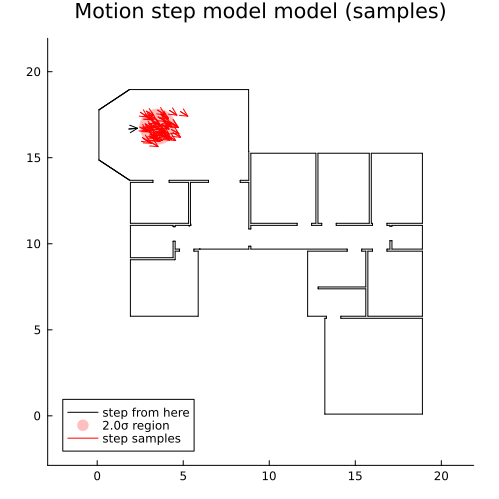

In [11]:
N_samples = 50
noiseless_step = robot_inputs.start.p + robot_inputs.controls[1].ds * robot_inputs.start.dp
step_samples = [step_model(robot_inputs.start, robot_inputs.controls[1], world_inputs, motion_settings) for _ in 1:N_samples]

the_plot = plot_world(world, "Motion step model model (samples)")
plot!(robot_inputs.start; color=:black, label="step from here")
plot!([noiseless_step[1]], [noiseless_step[2]];
      color=:red, label="$(round(std_devs_radius, digits=2))σ region", seriestype=:scatter,
      markersize=(20. * std_devs_radius * motion_settings.p_noise), markerstrokewidth=0, alpha=0.25)
plot!(step_samples; color=:red, label="step samples")
savefig("imgs/motion_step")
the_plot

### Traces: choice maps

We can also perform *traced execution* of a generative function using the construct `Gen.simulate`.  This means that certain information is recorded during execution and packaged into a *trace*, and this trace is returned instead of the bare return value sample.

The foremost information stored in the trace is the *choice map*, which is an associative array from labels to the labeled stochastic choices, i.e. occurrences of the `~` operator, that were encountered.  It is accessed by `Gen.get_choices`:

In [12]:
# `simulate` takes the GF plus a tuple of args to pass to it.
trace = simulate(start_pose_prior, (robot_inputs.start, motion_settings))
get_choices(trace)

│
├── :p : [1.611352904296693, 17.43122739979817]
│
└── :hd : 0.060817310483696256


The choice map being the point of focus of the trace in most discussions, we often abusively just speak of a *trace* when we really mean its *choice map*.

### Gen.jl API for traces

One can access the primitive choices in a trace using the bracket syntax `trace[address]`.  One can access from a trace the GF that produced it using `Gen.get_gen_fn`, along with with arguments that were supplied using `Gen.get_args`, and the return value sample of the GF using `Gen.get_retval`.  See below the fold for examples of all these.

In [13]:
trace[:p]

2-element Vector{Float64}:
  1.611352904296693
 17.43122739979817

In [14]:
trace[:hd]

0.060817310483696256

In [15]:
get_gen_fn(trace)

var"##StaticGenFunction_start_pose_prior#313"(Dict{Symbol, Any}(), Dict{Symbol, Any}())

In [16]:
get_args(trace)

("Pose([1.8437380952380948, 16.669857142857147], 0.08090409915523009)", (p_noise = 0.5, hd_noise = 0.017453292519943295))

In [17]:
get_retval(trace)

"Pose([1.611352904296693, 17.43122739979817], 0.060817310483696256)"

### Traces: scores/weights/densities

Traced execution of a generative function also produces a particular kind of score/weight/density.  It is very important to be clear about which score/weight/density value is to be expected, and why.  Consider a generative function of two inputs $x,y$ that flips a coin with weight $p$, and accordingly returns $x$ or $y$.  When $x$ and $y$ are unequal, a sensible reporting of the score/weight/density in the sampling process would produce $p$ or $1-p$ accordingly.  If the user supplied equal values $x = y$, then which score/weight/density should be returned?

One tempting view identifies a GF with a *distribution over its return values*.  In this view, the correct score/weight/density would be $1$.  Pursuing this approach for all GFs requires knowlege of all execution histories that might have produced any output, and then performing a sum over them.  For some small finite situations this may be fine, but this general problem of computing marginalizations is computationally impossible.  (More on this elsewhere, below a fold, or in an exercise?)  Therefore, this is ***not the viewpoint of Gen***, and the score/weight/density being introduced here is a ***different number***.

The only thing a program can reasonably be expected to know is the score/weight/density of its arriving at its return value *via the particular stochastic computation path* that got it there, and the approach of Gen (ProbComp in general?!) is to report this number.  The corresponding mathematical picture imagines GFs as factored into *distributions over choice maps*, whose the score/weight/density is computable, together with deterministic functions on these data that produce the return value from them.  In the toy example, the data of the choice map consists of the sampled Boolean value, its correct score/weight/density is $p$ or $1-p$, accordingly, and its return value function chooses $x$ or $y$, regardless of whether they are equal.

One may still be concerned with the distribution on return values.  This information arises in the aggregate of the sampled stochastic executions that lead to any return value, together with their weights.  (Check that this is true even in this simple example.)  In a sense, when we kick the can of marginalization down the road, we can proceed without difficulty.

The common practice of confusing traces with their choice maps continues here, and we speak of a GF inducing a "distribution over traces".

Let's have a look at the score/weight/densities in our running example.

A pose consists of a pair $z = (z_\text p, z_\text{hd})$ where $z_\text p$ is a position vector and $z_\text{hd}$ is an angle.  A control consists of a pair $(s, \eta)$ where $s$ is a distance of displacement and $\eta$ is a change in angle.  Write $u(\theta) = (\cos\theta, \sin\theta)$ for the unit vector in the direction $\theta$.  We are given a "world" $w$ and "motion settings" parameters $\nu = (\nu_\text p, \nu_\text{hd})$.

The models `start_pose_prior` and `step_model` correspond to distributions over their traces, respectively written $\text{start}$ and $\text{step}$.  In both cases these traces consist of the choices at addresses `:p` and `:hd`, so they may be identified with poses $z$ as above.  The distributions are defined as follows, when $y$ is a pose:
* $z \sim \text{start}(y, \nu)$ means that $z_\text p \sim \text{mvnormal}(y_\text p, \nu_\text p^2 I)$ and $z_\text{hd} \sim \text{normal}(y_\text{hd}, \nu_\text{hd})$ independently.
* $z \sim \text{step}(y, (s, \eta), w, \nu)$ means that $z_\text p \sim \text{mvnormal}(y_\text p + s\,u(y_\text{hd}), \nu_\text p^2 I)$ and $z_\text{hd} \sim \text{normal}(y_\text{hd} + \eta, \nu_\text {hd})$ independently.

The return values $\text{retval}(z)$ of these models are obtained from traces $z$ by reducing $z_\text{hd}$ modulo $2\pi$, and in the second case applying collision physics (relative to $w$) to the path from $y_\text p$ to $z_\text p$.  (We invite the reader to imagine if PropComp required us to compute the marginal density of the return value here!)  We have the following closed form for the density functions:
$$\begin{align*}
P_\text{start}(z; y, \nu)
&= P_\text{mvnormal}(z_\text p; y_\text p, \nu_\text p^2 I)
\cdot P_\text{normal}(z_\text{hd}; y_\text{hd}, \nu_\text{hd}), \\
P_\text{step}(z; y, (s, \eta), w, \nu)
&= P_\text{mvnormal}(z_\text p; y_\text p + s\,u(y_\text{hd}), \nu_\text p^2 I)
\cdot P_\text{normal}(z_\text{hd}; y_\text{hd} + \eta, \nu_\text{hd}).
\end{align*}$$

In general, the density of any trace factors as the product of the densities of the individual primitive choices that appear in it.  Since the primitive distributions of the language are equipped with efficient probability density functions, this overall computation is tractable.  It is represented by `Gen.get_score`:

In [18]:
get_score(trace)

0.7480587947596518

#### Subscores/subweights/subdensities

Instead of (the log of) the product of all the primitive choices made in a trace, one can take the product over just a subset using `Gen.project`.  See below the fold for examples.

In [19]:
project(trace, select())

0.0

In [20]:
project(trace, select(:p))

-1.7189577955360815

In [21]:
project(trace, select(:hd))

2.4670165902957333

In [22]:
project(trace, select(:p, :hd)) == get_score(trace)

true

### Updating traces

The metaprogramming approach of Gen affords the opportunity to explore alternate stochastic execution histories.  Namely, `Gen.update` takes as inputs a trace, together with modifications to its arguments and primitive choice values, and returns an accordingly modified trace.  It also returns (the log of) the ratio of the updated trace's density to the original trace's density, together with a precise record of the resulting modifications that played out.

In our example, one could, for instance, replace the first step's stochastic choice of heading with a specific value.

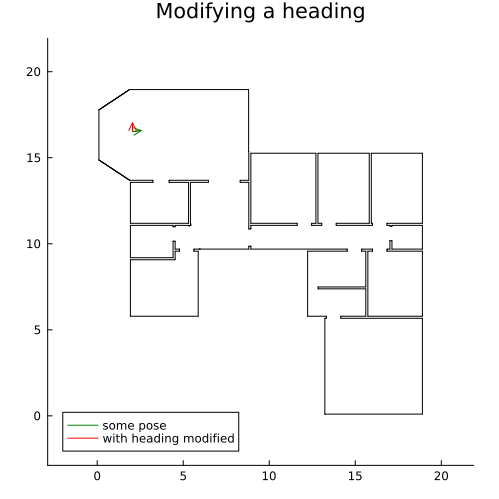

In [23]:
trace = simulate(start_pose_prior, (robot_inputs.start, motion_settings))
rotated_trace, rotated_trace_weight_diff, _, _ =
    update(trace, (robot_inputs.start, motion_settings), (NoChange(), NoChange()), choicemap((:hd, π/2.)))
the_plot = plot_world(world, "Modifying a heading")
plot!(get_retval(trace); color=:green, label="some pose")
plot!(get_retval(rotated_trace); color=:red, label="with heading modified")
savefig("imgs/modify_trace_1")
the_plot

The original trace was typical under the pose prior model, whereas the modified one is rather less likely.  This is the log of how much unlikelier:

In [24]:
rotated_trace_weight_diff

-3641.7205112911165

### Modeling a full path

The model contains all information in its trace, rendering its return value redundant.  The the noisy path integration will just be a wrapper around its functionality, extracting what it needs from the trace.

(It is worth acknowledging two strange things in the code below: the extra text "`_loop`" in the function name, and the seemingly redundant new parameter `T`.  Both will be addressed shortly, along with the aforementioned wrapper.)

In [25]:
@gen function path_model_loop(T :: Int, robot_inputs :: NamedTuple, world_inputs :: NamedTuple, motion_settings :: NamedTuple) :: Vector{Pose}
    pose = {:initial => :pose} ~ start_pose_prior(robot_inputs.start, motion_settings)

    for t in 1:T
        pose = {:steps => t => :pose} ~ step_model(pose, robot_inputs.controls[t], world_inputs, motion_settings)
    end
end

prefix_address(t :: Int, rest) :: Pair = (t == 1) ? (:initial => rest) : (:steps => (t-1) => rest)
get_path(trace) = [trace[prefix_address(t, :pose)] for t in 1:(get_args(trace)[1]+1)];

A trace of `path_model_loop` is more interesting than the ones for `start_pose_prior` and `step_model`.  Let's take a look.  (To reduce notebook clutter, we just show the start pose plus the initial 5 timesteps.)

In [26]:
trace = simulate(path_model_loop, (T, robot_inputs, world_inputs, motion_settings))
get_selected(get_choices(trace), select((prefix_address(t, :pose) for t in 1:6)...))

│
├── :initial
│   │
│   └── :pose
│       │
│       ├── :p : [3.4070147193639055, 16.29707930981551]
│       │
│       └── :hd : 0.07084469670420668
│
└── :steps
    │
    ├── 5
    │   │
    │   └── :pose
    │       │
    │       ├── :p : [8.048786957507879, 14.04846083667502]
    │       │
    │       └── :hd : -1.3962862106669356
    │
    ├── 4
    │   │
    │   └── :pose
    │       │
    │       ├── :p : [7.63091882619358, 14.550985553676576]
    │       │
    │       └── :hd : -0.6717705441167322
    │
    ├── 2
    │   │
    │   └── :pose
    │       │
    │       ├── :p : [7.019595291309208, 14.991961004073785]
    │       │
    │       └── :hd : -0.517941454923416
    │
    ├── 3
    │   │
    │   └── :pose
    │       │
    │       ├── :p : [7.576895585694655, 14.81806506247741]
    │       │
    │       └── :hd : -0.03285560815780402
    │
    └── 1
        │
        └── :pose
            │
            ├── :p : [5.585007002336012, 15.993769489421423]
            │
       

We find that a choicemap is a tree structure rather than a flat associative array.  Addresses are actually root-to-node paths, which are constructed using the `=>` operator.

Moreover, when the source code of a GF applies the `~` operator not to a primitive distribution but to some other generative function, the latter's choice map is included as a subtree rooted at the corresponding node.  That is, the choice map captures the recursive structure of the stochastic locations of the control flow.

The corresponding mathematical picture is as follows.  We write $x_{a:b} = (x_a, x_{a+1}, \ldots, x_b)$ to gather items $x_t$ into a vector.

In addition to the previous data, we are given an estimated start pose $r_0$ and controls $r_t = (s_t, \eta_t)$ for $t=1,\ldots,T$.  Then `path_model` corresponds to a distribution over traces denoted $\text{path}$; these traces are identified with vectors, namely, $z_{0:T} \sim \text{path}(r_{0:T}, w, \nu)$ is the same as $z_0 \sim \text{start}(r_0, \nu)$ and $z_t \sim \text{step}(z_{t-1}, r_t, w, \nu)$ for $t=1,\ldots,T$.  Here and henceforth we use the shorthand $\text{step}(z, \ldots) := \text{step}(\text{retval}(z), \ldots)$.  The density function is
$$
P_\text{path}(z_{0:T}; r_{0:T}, w, \nu)
= P_\text{start}(z_0; r_0, \nu) \cdot \prod\nolimits_{t=1}^T P_\text{step}(z_t; z_{t-1}, r_t, w, \nu)
$$
where each term, in turn, factors into a product of two (multivariate) normal densities as described above.

As our truncation of the example trace above might suggest, visualization is an essential practice in ProbComp.  We could very pass the output of the above `integrate_controls_noisy` to the `plot!` function to have a look at it.  However, we want to get started early in this notebook on a good habit: writing interpretive code for GFs in terms of their traces rather than their return values.  This enables the programmer include the parameters of the model in the display for clarity.

In [27]:
function frames_from_motion_trace(world, title, trace; show_clutters=false, std_devs_radius=2.)
    T = get_args(trace)[1]
    robot_inputs = get_args(trace)[2]
    poses = get_path(trace)
    noiseless_steps = [robot_inputs.start.p, [pose.p + c.ds * pose.dp for (pose, c) in zip(poses, robot_inputs.controls)]...]
    motion_settings = get_args(trace)[4]
    plots = Vector{Plots.Plot}(undef, T+1)
    for t in 1:(T+1)
        frame_plot = plot_world(world, title; show_clutters=show_clutters)
        plot!(poses[1:t-1]; color=:black, label="past poses")
        plot!([noiseless_steps[t][1]], [noiseless_steps[t][2]];
              color=:red, label="$(round(std_devs_radius, digits=2))σ region", seriestype=:scatter,
              markersize=(20. * std_devs_radius * motion_settings.p_noise), markerstrokewidth=0, alpha=0.25)
        plot!(Pose(trace[prefix_address(t, :pose => :p)], poses[t].hd); color=:red, label="sampled next step")
        plots[t] = frame_plot
    end
    return plots
end;

Here is what a step through the code looks like:

![](imgs_stable/path_model_with_trace.gif)

┌ Info: Saved animation to /Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/motion.gif
└ @ Plots /Users/sharlaon/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/motion.gif")
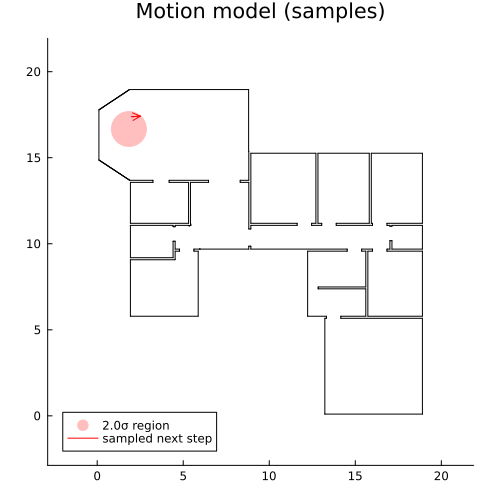

In [28]:
N_samples = 5

ani = Animation()
for n in 1:N_samples
    trace = simulate(path_model_loop, (T, robot_inputs, world_inputs, motion_settings))
    frames = frames_from_motion_trace(world, "Motion model (samples)", trace)
    for frame_plot in frames; frame(ani, frame_plot) end
end
gif(ani, "imgs/motion.gif", fps=2)

### Updating traces, revisited

In our example, suppose we replaced the $t = 1$ step's stochastic choice of heading with some specific value.

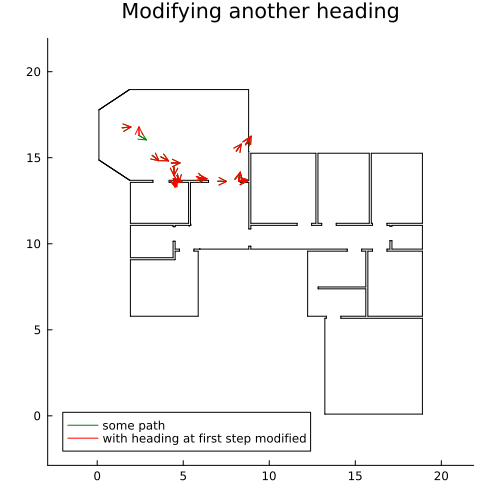

In [29]:
trace = simulate(path_model_loop, (T, robot_inputs, world_inputs, motion_settings))
rotated_first_step, rotated_first_step_weight_diff, _, _ =
    update(trace,
           (T, robot_inputs, world_inputs, motion_settings), (NoChange(), NoChange(), NoChange(), NoChange()),
           choicemap((:steps => 1 => :pose => :hd, π/2.)))
the_plot = plot_world(world, "Modifying another heading")
plot!(get_path(trace); color=:green, label="some path")
plot!(get_path(rotated_first_step); color=:red, label="with heading at first step modified")
savefig("imgs/modify_trace_1")
the_plot

In the above picture, the green path is apparently missing, having been near-completely overdrawn by the red path.  This is because in the execution of the model, the only change in the stochastic choices took place where we specified.  In particular, the stochastic choice of pose at the second step was left unchanged.  This choice was typical relative to the first step's heading in the old trace, and while it is not impossible relative to the first step's heading in the new trace, it is *far unlikelier* under the mulitvariate normal distribution supporting it:

In [30]:
rotated_first_step_weight_diff

-14549.43663366217

Another capability of `Gen.update` is to modify the *arguments* to the generative function used to produce the trace.  In our example, we might have on hand a very long list of controls, and we wish to explore the space of paths incrementally in the timestep:

In [31]:
change_only_T = (UnknownChange(), NoChange(), NoChange(), NoChange())

trace = simulate(path_model_loop, (0, robot_inputs, world_inputs, motion_settings))
for t in 1:T
    trace, _, _, _ = update(trace, (t, robot_inputs, world_inputs, motion_settings), change_only_T, choicemap())
    # ...
    # Do something with the trace of the partial path up to time t.
    # ...
    @assert has_value(get_choices(trace), :steps => t => :pose => :p)
    @assert !has_value(get_choices(trace), :steps => (t+1) => :pose => :p)
end

println("Success");

Success


Because performing such updates to traces occur frequently, and they seemingly require re-running the entire model, computational complexity considerations become important.  We detour next through an important speedup.

### Improving performance using the static DSL and combinators

Because the dynamic DSL does not understand the loop inside `path_model_loop`, calling `Gen.update` with the new value of `T` requires re-execution of the whole loop.  This means that the update requires $O(T)$ time, and the above code requires $O(T^2)$ time.

But we humans understand that incrementing the argument `T` simply requires running the loop body once more.  This operation runs in $O(1)$ time, so the outer loop should require only $O(T)$ time.  Gen can intelligently work this way if we encode the structure of Markov chain in this model using a *combinator* for the static DSL, as follows.

In [32]:
@gen (static) function motion_path_kernel(t :: Int, state :: Pose, robot_inputs :: NamedTuple, world_inputs :: NamedTuple, motion_settings :: NamedTuple) :: Pose
    return {:pose} ~ step_model(state, robot_inputs.controls[t], world_inputs, motion_settings)
end
motion_path_chain = Unfold(motion_path_kernel)

@gen (static) function path_model(T :: Int, robot_inputs :: NamedTuple, world_inputs :: NamedTuple, motion_settings :: NamedTuple) :: Vector{Pose}
    initial = {:initial => :pose} ~ start_pose_prior(robot_inputs.start, motion_settings)
    {:steps} ~ motion_path_chain(T, initial, robot_inputs, world_inputs, motion_settings)
end;

The models `path_model_loop` and `path_model` have been arranged to produce identically structured traces with the same frequencies and return values, and to correspond to identical distributions over traces in the mathematical picture, thereby yielding the same weights.  They give rise to identical computations under `Gen.simulate`, whereas the new model is sometimes more efficient under `Gen.update`.  Here we illustrate the efficiency gain.

(The noise in the graph is an artifact of Julia's garbage collection.)

![](imgs_stable/dynamic_static_comparison.png)

Owing to the efficiency comparison, we eschew `path_model_loop` in favor of `path_model` in what follows.  Thus we finally write our noisy path integration wrapper.

In [33]:
function integrate_controls_noisy(robot_inputs :: NamedTuple, world_inputs :: NamedTuple, motion_settings :: NamedTuple) :: Vector{Pose}
    return get_path(simulate(path_model, (length(robot_inputs.controls), robot_inputs, world_inputs, motion_settings)))
end;

### Ideal sensors

We now, additionally, assume the robot is equipped with sensors that cast rays upon the environment at certain angles relative to the given pose, and return the distance to a hit.

We first describe the ideal case, where the sensors return the true distances to the walls.

In [34]:
function sensor_distance(pose :: Pose, walls :: Vector{Segment}, box_size :: Float64) :: Float64
    d = minimum(distance(pose, seg) for seg in walls)
    # Capping to a finite value avoids issues below.
    return isinf(d) ? 2. * box_size : d
end;

sensor_angle(sensor_settings :: NamedTuple, j :: Int64) =
    sensor_settings.fov * (j - (sensor_settings.num_angles - 1) / 2.) / (sensor_settings.num_angles - 1)

function ideal_sensor(pose :: Pose, walls :: Vector{Segment}, sensor_settings :: NamedTuple) :: Vector{Float64}
    readings = Vector{Float64}(undef, sensor_settings.num_angles)
    for j in 1:sensor_settings.num_angles
        sensor_pose = rotate_pose(pose, sensor_angle(sensor_settings, j))
        readings[j] = sensor_distance(sensor_pose, walls, sensor_settings.box_size)
    end
    return readings
end;

In [35]:
# Plot sensor data.

function plot_sensors!(pose, color, readings, label, sensor_settings)
    plot!([pose.p[1]], [pose.p[2]]; color=color, label=nothing, seriestype=:scatter, markersize=3, markerstrokewidth=0)
    projections = [step_along_pose(rotate_pose(pose, sensor_angle(sensor_settings, j)), s) for (j, s) in enumerate(readings)]
    plot!(first.(projections), last.(projections);
            color=:blue, label=label, seriestype=:scatter, markersize=3, markerstrokewidth=1, alpha=0.25)
    plot!([Segment(pose.p, pr) for pr in projections]; color=:blue, label=nothing, alpha=0.25)
end

function frame_from_sensors(world, title, poses, poses_color, poses_label, pose, readings, readings_label, sensor_settings; show_clutters=false)
    the_plot = plot_world(world, title; show_clutters=show_clutters)
    plot!(poses; color=poses_color, label=poses_label)
    plot_sensors!(pose, poses_color, readings, readings_label, sensor_settings)
    return the_plot
end;

┌ Info: Saved animation to /Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/ideal_distances.gif
└ @ Plots /Users/sharlaon/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/ideal_distances.gif")
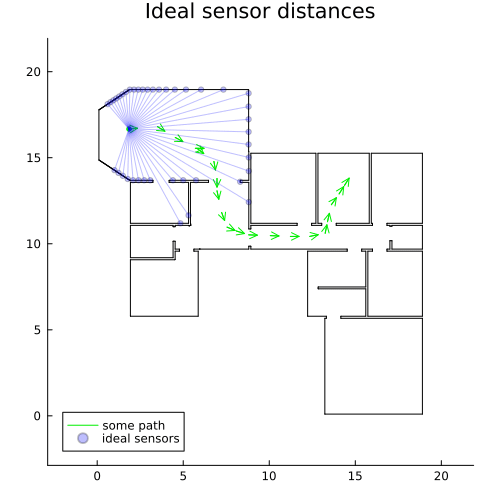

In [36]:
sensor_settings = (fov = 2π*(2/3), num_angles = 41, box_size = world.box_size)

ani = Animation()
for pose in path_integrated
    frame_plot = frame_from_sensors(
        world, "Ideal sensor distances",
        path_integrated, :green2, "some path",
        pose, ideal_sensor(pose, world.walls, sensor_settings), "ideal sensors",
        sensor_settings)
    frame(ani, frame_plot)
end
gif(ani, "imgs/ideal_distances.gif", fps=1)

### Noisy sensors

We assume that the sensor readings are themselves uncertain, say, the distances only knowable up to some noise.  We model this as follows.  (We satisfy ourselves with writing a loop in the dynamic DSL because we will have no need for incremental recomputation within this model.)

In [37]:
@gen function sensor_model(pose :: Pose, walls :: Vector{Segment}, sensor_settings :: NamedTuple) :: Vector{Float64}
    for j in 1:sensor_settings.num_angles
        sensor_pose = rotate_pose(pose, sensor_angle(sensor_settings, j))
        {j => :distance} ~ normal(sensor_distance(sensor_pose, walls, sensor_settings.box_size), sensor_settings.s_noise)
    end
end

function noisy_sensor(pose :: Pose, walls :: Vector{Segment}, sensor_settings :: NamedTuple) :: Vector{Float64}
    trace = simulate(sensor_model, (pose, walls, sensor_settings))
    return [trace[j => :distance] for j in 1:sensor_settings.num_angles]
end;

The trace contains many choices corresponding to directions of sensor reading from the input pose.  To reduce notebook clutter, here we just show a subset of 5 of them:

In [38]:
sensor_settings = (sensor_settings..., s_noise = 0.10)

trace = simulate(sensor_model, (robot_inputs.start, world.walls, sensor_settings))
get_selected(get_choices(trace), select((1:5)...))

│
├── 5
│   │
│   └── :distance : 3.193486932313592
│
├── 4
│   │
│   └── :distance : 3.0078578916448024
│
├── 2
│   │
│   └── :distance : 2.6836208142167854
│
├── 3
│   │
│   └── :distance : 2.7136987491388718
│
└── 1
    │
    └── :distance : 2.449680058956134


The mathematical picture is as follows.  Given the parameters of a pose $y$, walls $w$, and settings $\nu$, one gets a distribution $\text{sensor}(y, w, \nu)$ over the traces of `sensor_model`, and when $z$ is a motion model trace we set $\text{sensor}(z, w, \nu) := \text{sensor}(\text{retval}(z), w, \nu)$.  It samples are identified with vectors $o = (o^{(1)}, o^{(2)}, \ldots, o^{(J)})$, where $J := \nu_\text{num\_angles}$, each $o^{(j)}$ independently following a certain normal distribution (depending, notably, on the distance from the pose to the nearest wall).  Thus the density of $o$ factors into a product of the form
$$
P_\text{sensor}(o) = \prod\nolimits_{j=1}^J P_\text{normal}(o^{(j)})
$$
where we begin a habit of omitting the parameters to distributions that are implied by the code.

Visualizing the traces of the model is probably more useful for orientation, so we do this now.

In [39]:
function frame_from_sensors_trace(world, title, poses, poses_color, poses_label, pose, trace; show_clutters=false)
    readings = [trace[j => :distance] for j in 1:sensor_settings.num_angles]
    return frame_from_sensors(world, title, poses, poses_color, poses_label, pose,
                             readings, "trace sensors", get_args(trace)[3];
                             show_clutters=show_clutters)
end;

┌ Info: Saved animation to /Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/sensor_1.gif
└ @ Plots /Users/sharlaon/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/sensor_1.gif")
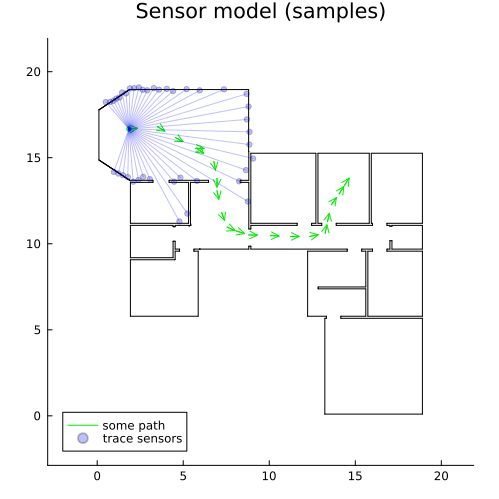

In [40]:
ani = Animation()
for pose in path_integrated
    trace = simulate(sensor_model, (pose, world.walls, sensor_settings))
    frame_plot = frame_from_sensors_trace(
        world, "Sensor model (samples)",
        path_integrated, :green2, "some path",
        pose, trace)
    frame(ani, frame_plot)
end
gif(ani, "imgs/sensor_1.gif", fps=1)

### Full model

We fold the sensor model into the motion model to form a "full model", which whose traces describe simulations of the entire robot situation as we have described it.

In [41]:
@gen (static) function full_model_initial(robot_inputs :: NamedTuple, walls :: Vector{Segment}, full_settings :: NamedTuple)  :: Pose
    pose ~ start_pose_prior(robot_inputs.start, full_settings.motion_settings)
    {:sensor} ~ sensor_model(pose, walls, full_settings.sensor_settings)
    return pose
end

@gen (static) function full_model_kernel(t :: Int, state :: Pose, robot_inputs :: NamedTuple, world_inputs :: NamedTuple,
                                      full_settings :: NamedTuple) :: Pose
    pose ~ step_model(state, robot_inputs.controls[t], world_inputs, full_settings.motion_settings)
    {:sensor} ~ sensor_model(pose, world_inputs.walls, full_settings.sensor_settings)
    return pose
end
full_model_chain = Unfold(full_model_kernel)

@gen (static) function full_model(T :: Int, robot_inputs :: NamedTuple, world_inputs :: NamedTuple, full_settings :: NamedTuple) :: Nothing
    initial ~ full_model_initial(robot_inputs, world_inputs.walls, full_settings)
    steps ~ full_model_chain(T, initial, robot_inputs, world_inputs, full_settings)
end

get_sensors(trace) =
    [[trace[prefix_address(t, :sensor => j => :distance)]
      for j in 1:get_args(trace)[4].sensor_settings.num_angles]
     for t in 1:(get_args(trace)[1]+1)];

Again, the trace of the full model contains many choices, so we just show a subset of them: the initial pose plus 2 timesteps, and 5 sensor readings from each.

In [42]:
full_settings = (motion_settings=motion_settings, sensor_settings=sensor_settings)
full_model_args = (robot_inputs, world_inputs, full_settings)

trace = simulate(full_model, (T, full_model_args...))
selection = select((prefix_address(t, :pose) for t in 1:3)..., (prefix_address(t, :sensor => j) for t in 1:3, j in 1:5)...)
get_selected(get_choices(trace), selection)

│
├── :initial
│   │
│   ├── :pose
│   │   │
│   │   ├── :p : [1.7092727889776689, 16.690666132422553]
│   │   │
│   │   └── :hd : 0.11791242309698187
│   │
│   └── :sensor
│       │
│       ├── 5
│       │   │
│       │   └── :distance : 3.064364917197891
│       │
│       ├── 4
│       │   │
│       │   └── :distance : 2.9581341327696773
│       │
│       ├── 2
│       │   │
│       │   └── :distance : 2.5435399876477573
│       │
│       ├── 3
│       │   │
│       │   └── :distance : 2.6769788577435363
│       │
│       └── 1
│           │
│           └── :distance : 2.319782181543527
│
└── :steps
    │
    ├── 2
    │   │
    │   ├── :pose
    │   │   │
    │   │   ├── :p : [3.888522840816552, 16.219010181995024]
    │   │   │
    │   │   └── :hd : -0.473440006726536
    │   │
    │   └── :sensor
    │       │
    │       ├── 5
    │       │   │
    │       │   └── :distance : 2.9129088713224887
    │       │
    │       ├── 4
    │       │   │
    │       │   └── :distance : 2.95

In the math picture, `full_model` corresponds to a distribution $\text{full}$ over its traces.  Such a trace is identified with of a pair $(z_{0:T}, o_{0:T})$ where $z_{0:T} \sim \text{path}(\ldots)$ and $o_t \sim \text{sensor}(z_t, \ldots)$ for $t=0,\ldots,T$.  The density of this trace is then
$$\begin{align*}
P_\text{full}(z_{0:T}, o_{0:T})
&= P_\text{path}(z_{0:T}) \cdot \prod\nolimits_{t=0}^T P_\text{sensor}(o_t) \\
&= \big(P_\text{start}(z_0)\ P_\text{sensor}(o_0)\big)
  \cdot \prod\nolimits_{t=1}^T \big(P_\text{step}(z_t)\ P_\text{sensor}(o_t)\big).
\end{align*}$$

By this point, visualization is essential.

In [43]:
function frames_from_full_trace(world, title, trace; show_clutters=false, std_devs_radius=2.)
    T = get_args(trace)[1]
    robot_inputs = get_args(trace)[2]
    poses = get_path(trace)
    noiseless_steps = [robot_inputs.start.p, [pose.p + c.ds * pose.dp for (pose, c) in zip(poses, robot_inputs.controls)]...]
    settings = get_args(trace)[4]
    sensor_readings = get_sensors(trace)
    plots = Vector{Plots.Plot}(undef, 2*(T+1))
    for t in 1:(T+1)
        frame_plot = plot_world(world, title; show_clutters=show_clutters)
        plot!(poses[1:t-1]; color=:black, label="past poses")
        plot!([noiseless_steps[t][1]], [noiseless_steps[t][2]];
              color=:red, label="$(round(std_devs_radius, digits=2))σ region", seriestype=:scatter,
              markersize=(20. * std_devs_radius * settings.motion_settings.p_noise), markerstrokewidth=0, alpha=0.25)
        plot!(Pose(trace[prefix_address(t, :pose => :p)], poses[t].hd); color=:red, label="sampled next step")
        plots[2*t-1] = frame_plot
        plots[2*t] = frame_from_sensors(
            world, title,
            poses[1:t], :black, nothing,
            poses[t], sensor_readings[t], "sampled sensors",
            settings.sensor_settings; show_clutters=show_clutters)
    end
    return plots
end;

Here is a stepping through the code:

![](imgs_stable/full_model_with_trace.gif)

┌ Info: Saved animation to /Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/full_1.gif
└ @ Plots /Users/sharlaon/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/full_1.gif")
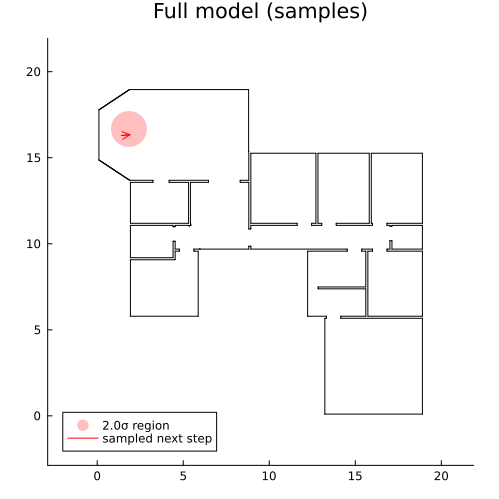

In [44]:
N_samples = 5

ani = Animation()
for n in 1:N_samples
    trace = simulate(full_model, (T, full_model_args...))
    frames = frames_from_full_trace(world, "Full model (samples)", trace)
    for frame_plot in frames; frame(ani, frame_plot) end
end
gif(ani, "imgs/full_1.gif", fps=2)

## The data

Let us generate some fixed synthetic motion data that, for pedagogical purposes, we will work with as if it were the actual path of the robot.  We will generate two versions, one each with low or high motion deviation.

┌ Info: Saved animation to /Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/the_data.gif
└ @ Plots /Users/sharlaon/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/the_data.gif")
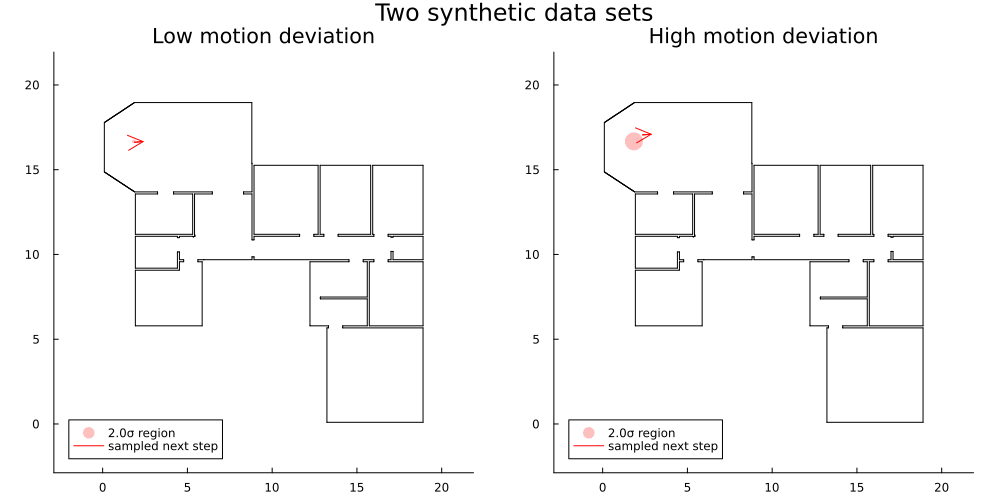

In [45]:
motion_settings_low_deviation = (p_noise = 0.05, hd_noise = (1/10.) * 2π / 360)
trace_low_deviation = simulate(full_model, (T, robot_inputs, world_inputs, (full_settings..., motion_settings=motion_settings_low_deviation)))

motion_settings_high_deviation = (p_noise = 0.25, hd_noise = 2π / 360)
trace_high_deviation = simulate(full_model, (T, robot_inputs, world_inputs, (full_settings..., motion_settings=motion_settings_high_deviation)))

frames_low = frames_from_full_trace(world, "Low motion deviation", trace_low_deviation)
frames_high = frames_from_full_trace(world, "High motion deviation", trace_high_deviation)
ani = Animation()
for (low, high) in zip(frames_low, frames_high)
    frame_plot = plot(low, high; size=(1000,500), plot_title="Two synthetic data sets")
    frame(ani, frame_plot)
end
gif(ani, "imgs/the_data.gif", fps=2)

Since we imagine these data as having been recorded from the real world, keep only their extracted data, *discarding* the traces that produced them.

In [46]:
# These are are what we hope to recover...
path_low_deviation = get_path(trace_low_deviation)
path_high_deviation = get_path(trace_high_deviation)

# ...using these data.
observations_low_deviation = get_sensors(trace_low_deviation)
observations_high_deviation = get_sensors(trace_high_deviation)

# Encode sensor readings into choice map.
constraint_from_sensors(t :: Int, readings :: Vector{Float64}) :: ChoiceMap =
    choicemap(( (prefix_address(t, :sensor => j => :distance), reading) for (j, reading) in enumerate(readings) )...)

constraints_low_deviation = [constraint_from_sensors(t, r) for (t, r) in enumerate(observations_low_deviation)]
constraints_high_deviation = [constraint_from_sensors(t, r) for (t, r) in enumerate(observations_high_deviation)]
merged_constraints_low_deviation = merge(constraints_low_deviation...)
merged_constraints_high_deviation = merge(constraints_high_deviation...);

We summarize the information available to the robot to determine its location.  On the one hand, one has guess of the start pose plus some controls, which one might integrate to produce an idealized guess of path.  On the other hand, one has the sensor data.

In [47]:
function plot_bare_sensors(world, title, readings, label, sensor_settings)
    border = world.box_size * (3.)/19.
    the_plot = plot(
        size         = (500, 500),
        aspect_ratio = :equal,
        grid         = false,
        xlim         = (world.bounding_box[1]-border, world.bounding_box[2]+border),
        ylim         = (world.bounding_box[3]-border, world.bounding_box[4]+border),
        title        = title,
        legend       = :bottomleft)
    plot_sensors!(Pose(world.center_point, 0.), :black, readings, label, sensor_settings)
    return the_plot
end;

┌ Info: Saved animation to /Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/robot_can_see.gif
└ @ Plots /Users/sharlaon/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/robot_can_see.gif")
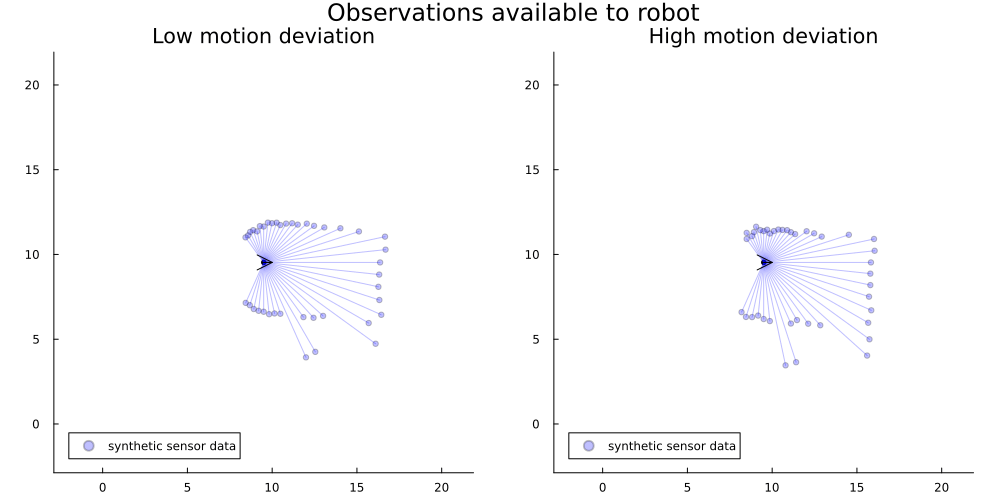

In [48]:
short_control(c) = "ds = $(round(c.ds, digits=2)), dhd = $(round(c.dhd, digits=2))"

ani = Animation()
for (t, (pose, readings_low, readings_high)) in enumerate(zip(path_integrated, observations_low_deviation, observations_high_deviation))
    # plot_integrated = plot_world(world, "Startup data")
    # plot!(path_integrated[1]; color=:green, label="start guess")
    # if t > 1; annotate!(5, 2.5, "Control $(t-1):\n$(short_control(robot_inputs.controls[t-1]))") end

    plot_low = plot_bare_sensors(world, "Low motion deviation", readings_low, "synthetic sensor data", sensor_settings)
    plot!(Pose(world.center_point, 0.0); color=:black, label=nothing)

    plot_high = plot_bare_sensors(world, "High motion deviation", readings_high, "synthetic sensor data", sensor_settings)
    plot!(Pose(world.center_point, 0.0); color=:black, label=nothing)

    the_frame = plot(plot_low, plot_high; size=(1000,500), layout=grid(1,2), plot_title="Observations available to robot")
    frame(ani, the_frame)
end
gif(ani, "imgs/robot_can_see.gif", fps=2)

## Inference

### Why we need inference: in a picture

The path obtained by integrating the controls serves as a proposal for the true path, but it is unsatisfactory, especially in the high motion deviation case.  The picture gives an intuitive sense of the fit:

┌ Info: Saved animation to /Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/need.gif
└ @ Plots /Users/sharlaon/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/need.gif")
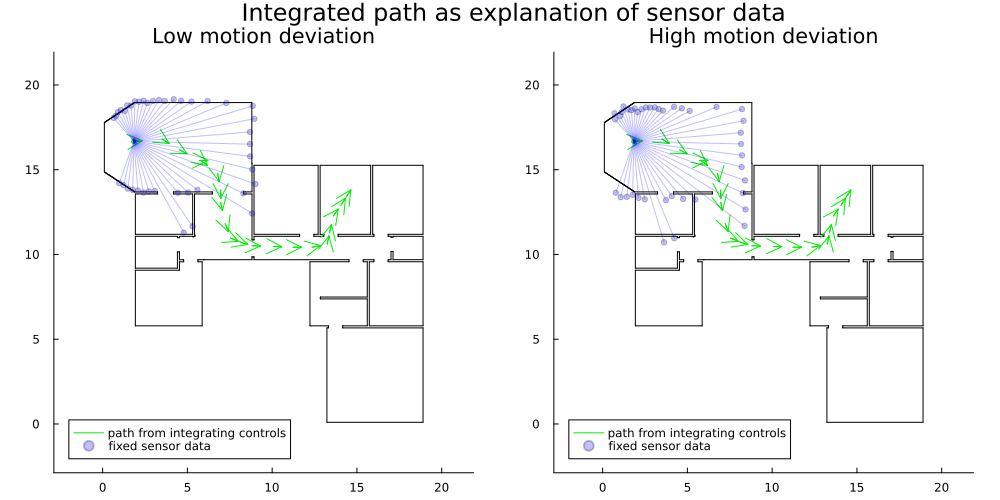

In [49]:
ani = Animation()
for (pose, readings_low, readings_high) in zip(path_integrated, observations_low_deviation, observations_high_deviation)
    low_plot = frame_from_sensors(
        world, "Low motion deviation",
        path_integrated, :green2, "path from integrating controls",
        pose, readings_low, "fixed sensor data",
        sensor_settings)
    high_plot = frame_from_sensors(
        world, "High motion deviation",
        path_integrated, :green2, "path from integrating controls",
        pose, readings_high, "fixed sensor data",
        sensor_settings)
    frame_plot = plot(low_plot, high_plot; size=(1000,500), plot_title="Integrated path as explanation of sensor data")
    frame(ani, frame_plot)
end
gif(ani, "imgs/need.gif", fps=1)

It would seem that the fit is reasonable in low motion deviation, but really breaks down in high motion deviation.

We are not limited to visual judgments here: the model can quantitatively assess how good a fit the integrated path is for the data.  In order to do this, we detour to explain how to produce samples from our model that agree with the fixed observation data.

### Generating samples with constraints

We have seen how `Gen.simulate` performs traced execution of a generative function: as the program runs, it draws stochastic choices from all required primitive distributions, and records them in a choice map.

Given a choice map of *constraints* that declare fixed values of some of the primitive choices, the operation `Gen.generate` proposes traces of the generative function that are consistent with these constraints.

In [50]:
trace, log_weight = generate(full_model, (T, full_model_args...), merged_constraints_low_deviation)

all(trace[prefix_address(i, :sensor => j => :distance)] == merged_constraints_low_deviation[prefix_address(i, :sensor => j => :distance)]
    for i in 1:(T+1) for j in 1:sensor_settings.num_angles)

true

A trace resulting from a call to `Gen.generate` is structurally indistinguishable from one drawn from `Gen.simulate`.  But there is a key situational difference: while `Gen.get_score` always returns the frequency with which `Gen.simulate` stochastically produces the trace, this value is **no longer equal to** the frequency with which the trace is stochastically produced by `Gen.generate`.  This is both true in an obvious and less relevant sense, as well as true in a more subtle and extremely germane sense.

On the superficial level, since all traces produced by `Gen.generate` are consistent with the constraints, those traces that are inconsistent with the constraints do not occur at all, and in aggregate the traces that are consistent with the constraints are more common.

More deeply and importantly, the stochastic choice of the *constraints* under a run of `Gen.simulate` might have any density, perhaps very low.  This constraints density contributes as always to the `Gen.get_score`, whereas it does not influence the frequency of producing this trace under `Gen.generate`.

The ratio of the `Gen.get_score` of a trace to the probability density that `Gen.generate` would produce it with the given constraints, is called the *importance weight*.  For convenience, (the log of) this quantity is returned by `Gen.generate` along with the trace.

We stress the basic invariant:
$$
\text{get\_score}(\text{trace})
=
(\text{importance weight from Gen.generate})
\cdot
(\text{frequency Gen.generate creates this trace}).
$$

The preceding comments apply to generative functions in wide generality.  We can say even more about our present examples, because further assumptions hold.
1. There is no untraced randomness.  Given a full choice map for constraints, everything else is deterministic.  In particular, the importance weight is the `get_score`.
2. The generative function was constructed using Gen's DSLs and primitive distributions.  Ancestral sampling; `Gen.generate` wit empty constraints reduces to `Gen.simulate` with importance weight $1$.
3. Combined, the importance weight is directly computed as the `Gen.project` of the trace upon the choice map addresses that were constrained in the call to `Gen.generate`.
  
  In our running example, the projection in question is $\prod_{t=0}^T P_\text{sensor}(o_t)$.

In [51]:
log_weight - project(trace, select([prefix_address(i, :sensor) for i in 1:(T+1)]...))

0.0

### Why we need inference: in numbers

We return to how the model offers a numerical benchmark for how good a fit the integrated path is.

In words, the data are incongruously unlikely for the integrated path.  The (log) density of the measurement data, given the integrated path...

In [52]:
constraints_path_integrated =
    choicemap(((prefix_address(t, :pose => :p), path_integrated[t].p) for t in 1:(T+1))...,
              ((prefix_address(t, :pose => :hd), path_integrated[t].hd) for t in 1:(T+1))...)

constraints_path_integrated_observations_low_deviation =
    merge(constraints_path_integrated, merged_constraints_low_deviation)
constraints_path_integrated_observations_high_deviation =
    merge(constraints_path_integrated, merged_constraints_high_deviation)

trace_path_integrated_observations_low_deviation, _ =
    generate(full_model, (T, full_model_args...), constraints_path_integrated_observations_low_deviation)
trace_path_integrated_observations_high_deviation, _ =
    generate(full_model, (T, full_model_args...), constraints_path_integrated_observations_high_deviation);

selection = select((prefix_address(i, :sensor => j => :distance) for i in 1:(T+1), j in 1:sensor_settings.num_angles)...)

println("Log density of low deviation observations assuming integrated path: $(project(trace_path_integrated_observations_low_deviation, selection))")
println("Log density of high deviation observations assuming integrated path: $(project(trace_path_integrated_observations_high_deviation, selection))");

Log density of low deviation observations assuming integrated path: -50715.95906609635
Log density of high deviation observations assuming integrated path: -262634.5469879506


...more closely resembles the density of these data back-fitted onto any other typical (random) paths of the model...

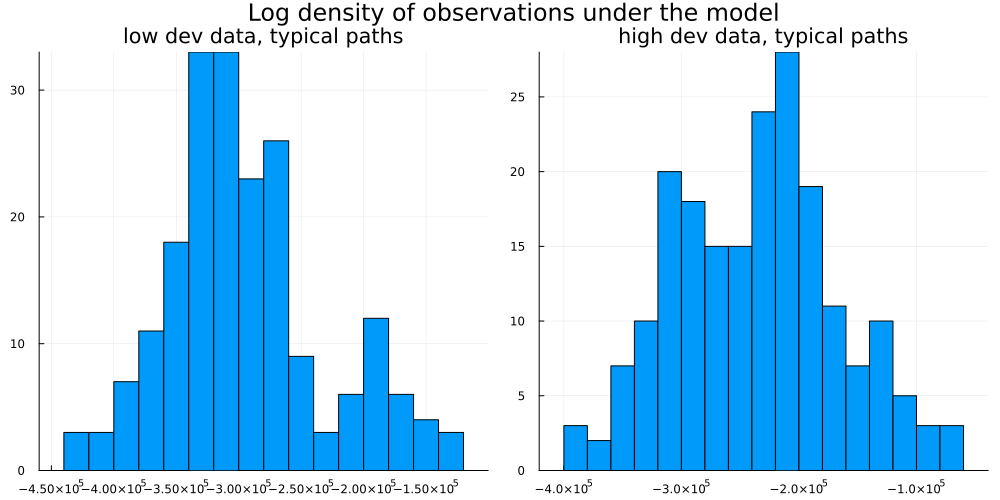

In [53]:
N_samples = 200

traces_generated_low_deviation = [generate(full_model, (T, full_model_args...), merged_constraints_low_deviation)[1] for _ in 1:N_samples]
log_likelihoods_low_deviation = [project(trace, selection) for trace in traces_generated_low_deviation]
hist_low_deviation = histogram(log_likelihoods_low_deviation; label=nothing, bins=20, title="low dev data, typical paths")

traces_generated_high_deviation = [generate(full_model, (T, full_model_args...), merged_constraints_high_deviation)[1] for _ in 1:N_samples]
log_likelihoods_high_deviation = [project(trace, selection) for trace in traces_generated_high_deviation]
hist_high_deviation = histogram(log_likelihoods_high_deviation; label=nothing, bins=20, title="high dev data, typical paths")

the_plot = plot(hist_low_deviation, hist_high_deviation; size=(1000,500), layout=grid(1,2), plot_title="Log density of observations under the model")
savefig("imgs/likelihoods")
the_plot

...than the log densities of data typically produced by the complete model run in its natural manner (*compare the scale at the bottom*):

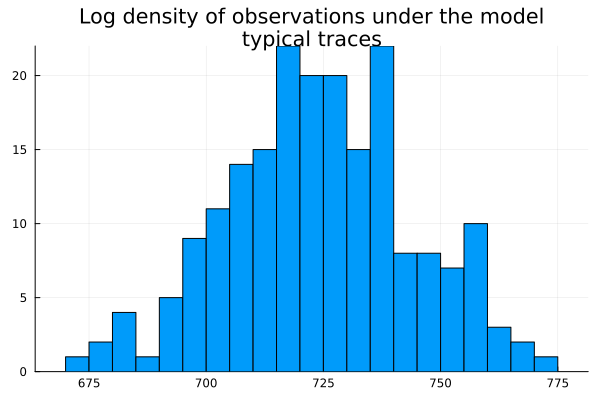

In [54]:
traces_typical = [simulate(full_model, (T, full_model_args...)) for _ in 1:N_samples]
log_likelihoods_typical = [project(trace, selection) for trace in traces_typical]
hist_typical = histogram(log_likelihoods_typical; label=nothing, bins=20, title="Log density of observations under the model\ntypical traces")

### Inference: demonstration

In the viewpoint of ProbComp, the goal of *inference* is to produce *likely* traces of a full model, given the observed data.  In the langauge of probability theory, as generative functions induce distributions on traces, and if we view the full model as a program embodying a *prior*, then applying an inference metaprogram to it (together with the observed data) produces a new program that embodies the *posterior*.

Let's show what we mean with a picture, keeping the code black-boxed until we explain it later.

In [55]:
# Load function `black_box_inference(constraints)`.

include("black_box.jl")

Main.BlackBox

In [56]:
# Visualize distributions over traces.

function frame_from_traces(world, title, path, path_label, traces, trace_label; show_clutters=false)
    the_plot = plot_world(world, title; show_clutters=show_clutters)
    if !isnothing(path); plot!(path; label=path_label, color=:brown) end
    for trace in traces
        poses = get_path(trace)
        plot!([p.p[1] for p in poses], [p.p[2] for p in poses]; label=nothing, color=:green, alpha=0.3)
        plot!([Segment(p1, p2) for (p1, p2) in zip(poses[1:end-1], poses[2:end])];
              label=trace_label, color=:green, seriestype=:scatter, markersize=3, markerstrokewidth=0, alpha=0.3)
        trace_label = nothing
    end
    return the_plot
end;

Time elapsed per run (low dev): 794.4 ms. (Total: 7944 ms.)


Time elapsed per run (high dev): 549.0 ms. (Total: 5490 ms.)


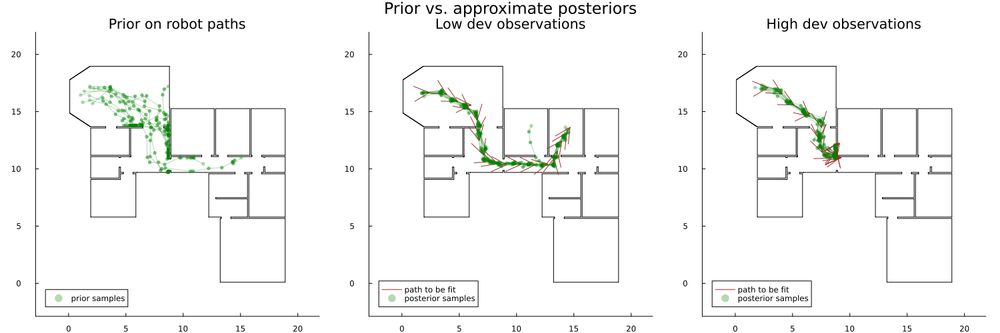

In [57]:
N_samples = 10

traces = [simulate(full_model, (T, full_model_args...)) for _ in 1:N_samples]
prior_plot = frame_from_traces(world, "Prior on robot paths", nothing, nothing, traces, "prior samples")

t1 = now()
traces = [BlackBox.black_box_inference(full_model, full_model_args, T, constraints_low_deviation) for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (low dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_low_deviation = frame_from_traces(world, "Low dev observations", path_low_deviation, "path to be fit", traces, "posterior samples")

t1 = now()
traces = [BlackBox.black_box_inference(full_model, full_model_args, T, constraints_high_deviation) for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (high dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_high_deviation = frame_from_traces(world, "High dev observations", path_high_deviation, "path to be fit", traces, "posterior samples")

the_plot = plot(prior_plot, posterior_plot_low_deviation, posterior_plot_high_deviation; size=(1500,500), layout=grid(1,3), plot_title="Prior vs. approximate posteriors")
savefig("imgs/prior_posterior")
the_plot

All of the traces thus produced have observations constrained to the data.  The log densities of the observations under their typical samples show some improvement:

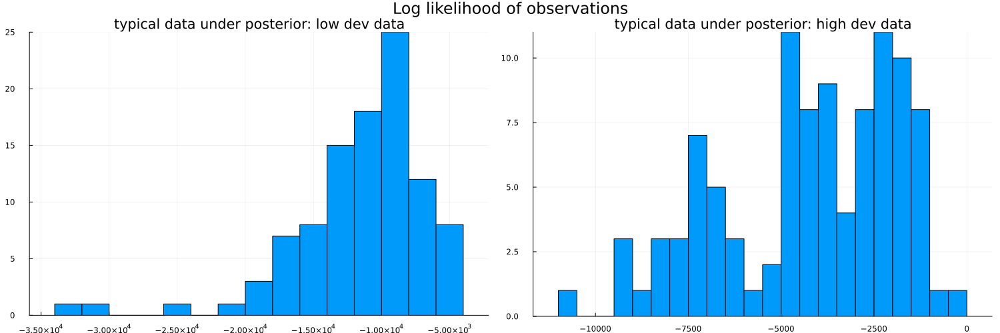

In [58]:
N_samples = 100

traces_posterior_low_deviation = [BlackBox.black_box_inference(full_model, full_model_args, T, constraints_low_deviation) for _ in 1:N_samples]
log_likelihoods_low_deviation = [project(trace, selection) for trace in traces_posterior_low_deviation]
hist_low_deviation = histogram(log_likelihoods_low_deviation; label=nothing, bins=20, title="typical data under posterior: low dev data")

traces_posterior_high_deviation = [BlackBox.black_box_inference(full_model, full_model_args, T, constraints_high_deviation) for _ in 1:N_samples]
log_likelihoods_high_deviation = [project(trace, selection) for trace in traces_posterior_high_deviation]
hist_high_deviation = histogram(log_likelihoods_high_deviation; label=nothing, bins=20, title="typical data under posterior: high dev data")

the_plot = plot(hist_low_deviation, hist_high_deviation; size=(1500,500), layout=grid(1,2), plot_title="Log likelihood of observations")
savefig("imgs/likelihoods")
the_plot

## Generic strategies for inference

We now spell out some generic strategies for conditioning the ouputs of a model towards some observed data.  The word "generic" indicates that they make no special intelligent use of the model structure, and their convergence is guaranteed by theorems of a similar nature.  In terms to be defined shortly, they simply take a pair $(Q,f)$ of a proposal and a weight function that implement importance sampling with target $P$.

There is no free lunch in this game: generic inference recipies are inefficient, for example, converging very slowly or needing vast counts of particles, especially in high-dimensional settings.  One of the root problems is that proposals $Q$ may provide arbitrarily bad samples relative to our target $P$; if $Q$ still supports all samples of $P$ with microscopic but nonzero density, then the generic algorithm will converge in the limit, however astronomically slowly.

Rather, efficiency will become possible when we do the *opposite* of generic: exploit what we actually know about the problem in our design of the inference strategy to propose better traces towards our target.  Gen's aim is to provide the right entry points to enact this exploitation.

### The posterior distribution, `Gen.generate`, and importance sampling

Mathematically, the passage from the prior to the posterior is the operation of conditioning distributions.

Intuitively, the conditional distribution $\text{full}(\cdot | o_{0:T})$ is just the restriction of the joint distribution $\text{full}(z_{0:T}, o_{0:T})$ to where the parameter $o_{0:T}$ is constant, letting $z_{0:T}$ continue to vary.  This restriction no longer has total density equal to $1$, so we must renormalize it.  The normalizing constant must be
$$
P_\text{marginal}(o_{0:T})
:= \int P_\text{full}(Z_{0:T}, o_{0:T}) \, dZ_{0:T}
 = \mathbf{E}_{Z_{0:T} \sim \text{path}}\big[P_\text{full}(Z_{0:T}, o_{0:T})\big].
$$
By Fubini's Theorem, this function of $o_{0:T}$ is the density of a probability distribution over observations $o_{0:T}$, called the *marginal distribution*; but we will often have $o_{0:T}$ fixed, and consider it a constant.  Then, finally, the *conditional distribution* $\text{full}(\cdot | o_{0:T})$ is defined to have the normalized density
$$
P_\text{full}(z_{0:T} | o_{0:T}) := \frac{P_\text{full}(z_{0:T}, o_{0:T})}{P_\text{marginal}(o_{0:T})}.
$$

The goal of inference is to produce samples $\text{trace}_{0:T}$ distributed (approximately) according to $\text{full}(\cdot | o_{0:T})$.  The most immediately evident problem with doing inference is that the quantity $P_\text{marginal}(o_{0:T})$ is intractable!

Define the function $\hat f(z_{0:T})$ of sample values $z_{0:T}$ to be the ratio of probability densities between the posterior distribution $\text{full}(\cdot | o_{0:T})$ that we wish to sample from, and the prior distribution $\text{path}$ that we are presently able to produce samples from.  Manipulating it à la Bayes's Rule gives:
$$
\hat f(z_{0:T})
:=
\frac{P_\text{full}(z_{0:T} | o_{0:T})}{P_\text{path}(z_{0:T})}
=
\frac{P_\text{full}(z_{0:T}, o_{0:T})}{P_\text{marginal}(o_{0:T}) \cdot P_\text{path}(z_{0:T})}
=
\frac{\prod_{t=0}^T P_\text{sensor}(o_t)}{P_\text{marginal}(o_{0:T})}.
$$
Noting that the intractable quantity
$$
Z := P_\text{marginal}(o_{0:T})
$$
is constant in $z_{0:T}$, we define the explicitly computable quantity
$$
f(z_{0:T}) := Z \cdot \hat f(z_{0:T}) = \prod\nolimits_{t=0}^T P_\text{sensor}(o_t).
$$
The right hand side has been written sloppily, but we remind the reader that $P_\text{sensor}(o_t)$ is a product of densities of normal distributions that *does depend* on $z_t$ as well as "sensor" and "world" parameters.

Compare to our previous description of calling `Gen.generate` on `full_model` with the observations $o_{0:T}$ as constraints: it produces a trace of the form $(z_{0:T}, o_{0:T})$ where $z_{0:T} \sim \text{path}$ has been drawn from $\text{path}$, together with the weight equal to none other than this $f(z_{0:T})$.

This reasoning involving `Gen.generate` is indicative of the general scenario with conditioning, and fits into the following shape.

We have on hand two distributions, a *target* $P$ from which we would like to (approximately) generate samples, and a *proposal* $Q$ from which we are presently able to generate samples.  We must assume that the proposal is a suitable substitute for the target, in the sense that every possible event under $P$ occurs under $Q$ (mathematically, $P$ is absolutely continuous with respect to $Q$).

Under these hypotheses, there is a well-defined density ratio function $\hat f$ between $P$ and $Q$ (mathematically, the Radon–Nikodym derivative).  If $z$ is a sample drawn from $Q$, then $\hat w = \hat f(z)$ is how much more or less likely $z$ would have been drawn from $P$.  We only require that we are able to compute the *unnormalized* density ratio, that is, some function of the form $f = Z \cdot \hat f$ where $Z > 0$ is constant.

The pair $(Q,f)$ is said to implement *importance sampling* for $P$, and the values of $f$ are called *importance weights*.  Generic inference attempts to use knowledge of $f$ to correct for the difference in behavior between $P$ and $Q$, and thereby use $Q$ to produce samples from (approximately) $P$.

So in our running example, the target $P$ is the posterior distribution on paths $\text{full}(\cdot | o_{0:T})$, the proposal $Q$ is the path prior $\text{path}$, and the importance weight $f$ is the product of the sensor model densities.  We seek a computational model of the first; the second and third are computationally modeled by calling `Gen.generate` on `full_model` constrained by the observations $o_{0:T}$.  (The computation of the second, on its own, simplifies to `path_prior`.)

We represent this discussion in code for future use:

In [59]:
function importance_sample(model, args, merged_constraints, N_samples)
    traces = Vector{Trace}(undef, N_samples)
    log_weights = Vector{Float64}(undef, N_samples)

    for i in 1:N_samples
        traces[i], log_weights[i] = generate(model, args, merged_constraints)
    end

    return traces, log_weights
end;

### Rejection sampling

One approach to inference, called *rejection sampling*, is to interfere with the probabilities of samples by throttling them in the correct proportions.  In other words, we go ahead and generate samples from $Q$, but accept (return) only some of them while rejecting (discarding) others, the probability of acceptance depending on the sampled value.  If for each sampled value $z$ the probability of acceptance is a constant times $f(z)$ (or equivalently $\hat f(z)$), then the samples that make it through will be distributed according to $P$.

More precisely, in deciding whether to accept or reject a sample $z$, we flip a weight-$p(z)$ coin where $p(z) = f(z)/C$ for some constant $C > 0$, accepting if heads and rejecting of tails.  In order for this to make sense, $p(z)$ must always lie in the interval $[0,1]$.  This is equivalent to having $f(z) \leq C$, that is, we need $C$ to be an *upper bound* on the outputs of the function $f$.  There is an optimal upper bound constant, namely the supremum value $C_\text{opt} = \max_z f(z)$.  If we only know *some* upper bound $C \geq C_\text{opt}$, then rejection sampling with this constant still provides a correct algorithm, but it is inefficient by drawing a factor of $C/C_\text{opt}$ too many samples on average.

The first of many problems with rejection sampling is the tractability of determining an upper bound $C$!  (This is independent of the intractability of determining the constant $Z$ above relating $f$ back to $\hat f$.)

We can try to make do anyway, using a number $C > 0$ that is *guess* at an upper bound; when we proceed with this $C$ under the assumption that it bounds $f$, the resulting algorithm is called *approximate rejection sampling*.  But what to do if we encounter a sample $z$ with $f(z) > C$?  If our policy is to replace $C$ with this new larger quantity and keep going, the resulting algorithm is called *adaptive approximate rejection sampling*.  Earlier samples, with a too-low intitial value for $C$, may occur with too high absolute frequency.  But over time as $C$ appropriately increases, the behavior tends towards the true distribution.  We may consider some of this early phase to be an *exploration* or *burn-in period*, and accordingly draw samples but keep only the maximum of their weights, before moving on to the rejection sampling *per se*.

In [60]:
function rejection_sample(model, args, merged_constraints, N_burn_in, N_particles, MAX_attempts)
    C = maximum(generate(model, args, merged_constraints)[2] for _ in 1:N_burn_in; init=-Inf)

    particles = []
    for _ in 1:N_particles
        attempts = 0
        while attempts < MAX_attempts
            attempts += 1

            # The use of `generate` is as explained in the preceding section.
            particle, weight = generate(model, args, merged_constraints)
            if weight > C + log(rand())
                if weight > C; C = weight end
                push!(particles, particle)
                break
            end
        end
    end

    return particles
end;

In the following examples, compare the requested number of particles (`N_particles`) to the number of particles found within the compute budget (`MAX_attempts`), as reported in the graph.

Time elapsed per run (short path): 4222.55 ms. (Total: 84451 ms.)


┌ Info: Saved animation to /Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/RS.gif
└ @ Plots /Users/sharlaon/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/RS.gif")
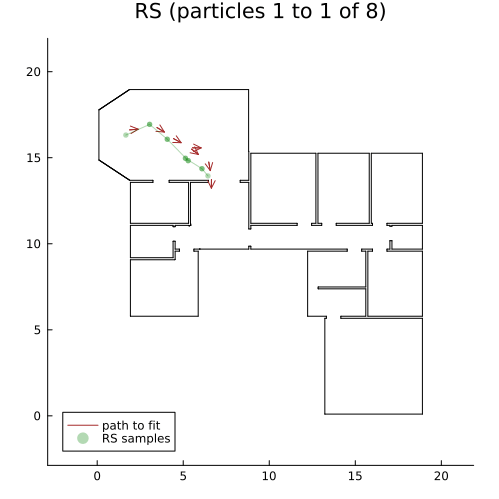

In [61]:
T_short = 6

N_burn_in = 0 # omit burn-in to illustrate early behavior
N_particles = 20
MAX_attempts = 5000

t1 = now()
traces = rejection_sample(full_model, (T_short, full_model_args...), merged_constraints_low_deviation, N_burn_in, N_particles, MAX_attempts)
t2 = now()
println("Time elapsed per run (short path): $(value(t2 - t1) / N_particles) ms. (Total: $(value(t2 - t1)) ms.)")

ani = Animation()
for (i, trace) in enumerate(traces)
    frame_plot = frame_from_traces(world, "RS (particles 1 to $i of $(length(traces)))", path_low_deviation[1:(T_short+1)],
                                   "path to fit", traces[1:i], "RS samples")
    frame(ani, frame_plot)
end
gif(ani, "imgs/RS.gif", fps=1)

Time elapsed per run (short path): 4673.75 ms. (Total: 93475 ms.)


┌ Info: Saved animation to /Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/RS_2.gif
└ @ Plots /Users/sharlaon/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/RS_2.gif")
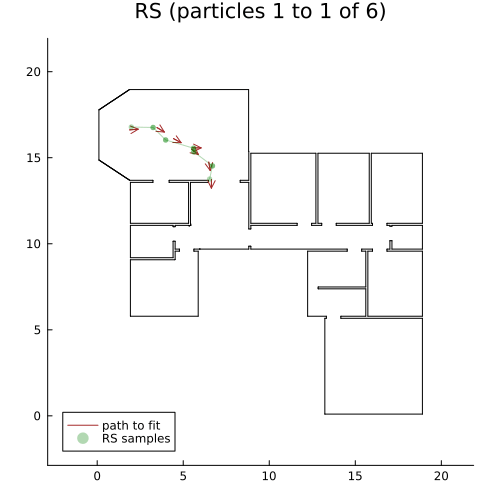

In [62]:
N_burn_in = 100
N_particles = 20
MAX_attempts = 5000

t1 = now()
traces = rejection_sample(full_model, (T_short, full_model_args...), merged_constraints_low_deviation, N_burn_in, N_particles, MAX_attempts)
t2 = now()
println("Time elapsed per run (short path): $(value(t2 - t1) / N_particles) ms. (Total: $(value(t2 - t1)) ms.)")

ani = Animation()
for (i, trace) in enumerate(traces)
    frame_plot = frame_from_traces(world, "RS (particles 1 to $i of $(length(traces)))", path_low_deviation[1:(T_short+1)],
                                   "path to fit", traces[1:i], "RS samples")
    frame(ani, frame_plot)
end
gif(ani, "imgs/RS_2.gif", fps=1)

Time elapsed per run (short path): 4608.3 ms. (Total: 92166 ms.)


┌ Info: Saved animation to /Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/RS_3.gif
└ @ Plots /Users/sharlaon/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/RS_3.gif")
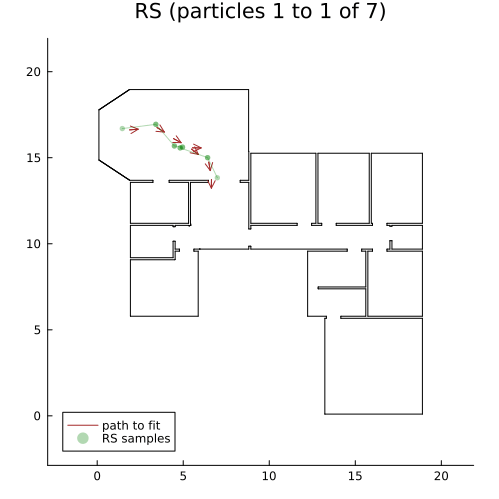

In [63]:
N_burn_in = 1000
N_particles = 20
MAX_attempts = 5000

t1 = now()
traces = rejection_sample(full_model, (T_short, full_model_args...), merged_constraints_low_deviation, N_burn_in, N_particles, MAX_attempts)
t2 = now()
println("Time elapsed per run (short path): $(value(t2 - t1) / N_particles) ms. (Total: $(value(t2 - t1)) ms.)")

ani = Animation()
for (i, trace) in enumerate(traces)
    frame_plot = frame_from_traces(world, "RS (particles 1 to $i of $(length(traces)))", path_low_deviation[1:(T_short+1)],
                                   "path to fit", traces[1:i], "RS samples")
    frame(ani, frame_plot)
end
gif(ani, "imgs/RS_3.gif", fps=1)

The performance dynamics of this algorithm an instructive exercise to game out.

In general, as $C$ increases, the algorithm is increasingly *wasteful*, rejecting more samples overall, and taking longer to find likely hits.

So long as it indeed bounds above all values of $f(z)$ that we encounter, the algorithm isn't nonsense, but if the proposal $Q$ is unlikely to generate representative samples for the target $P$ at all, all we are doing is adjusting the shape of the noise.

### Sampling / importance resampling

We turn to inference strategies that require only our proposal $Q$ and unnormalized weight function $f$ for the target $P$, *without* forcing us to wrangle any intractable integrals or upper bounds.

Suppose we are given a list of nonnegative numbers, not all zero: $w^1, w^2, \ldots, w^N$.  To *normalize* the numbers means computing $\hat w^i := w^i / \sum_{j=1}^N w^j$.  The normalized list $\hat w^1, \hat w^2, \ldots, \hat w^N$ determines a *categorical distribution* on the indices $1, \ldots, N$, wherein the index $i$ occurs with probability $\hat w^i$. 
Note that for any constant $Z > 0$, the scaled list $Zw^1, Zw^2, \ldots, Zw^N$ leads to the same normalized $\hat w^i$ as well as the same categorical distribution.

When some list of data $z^1, z^2, \ldots, z^N$ have been associated with these respective numbers $w^1, w^2, \ldots, w^N$, then to *importance **re**sample* $M$ values from these data according to these weights means to independently sample indices $a^1, a^2, \ldots, a^M \sim \text{categorical}([\hat w^1, \hat w^2, \ldots, \hat w^N])$ and return the new list of data $z^{a^1}, z^{a^2}, \ldots, z^{a^M}$.  Compare to the function `resample` implemented near the black box above.

The *sampling / importance resampling* (SIR) strategy for inference runs as follows.  Let counts $N > 0$ and $M > 0$ be given.
1. Importance sample:  Independently sample $N$ data $z^1, z^2, \ldots, z^N$ from the proposal $Q$, called *particles*.  Compute also their *importance weights* $w^i := f(z^i)$ for $i = 1, \ldots, N$.
2. Importance resample:  Independently sample $M$ indices $a^1, a^2, \ldots, a^M \sim \text{categorical}([\hat w^1, \hat w^2, \ldots, \hat w^N])$, where $\hat w^i = w^i / \sum_{j=1}^N w^j$, and return $z^{a^1}, z^{a^2}, \ldots, z^{a^M}$. These sampled particles all inherit the *average weight* $\sum_{j=1}^N w^j / N$.

As $N \to \infty$ with $M$ fixed, the samples produced by this algorithm converge to $M$ independent samples drawn from the target $P$.  This strategy is computationally an improvement over rejection sampling: intead of indefinitely constructing and rejecting samples, we can guarantee to use at least some of them after a fixed time, and we are using the best guesses among these.

In [64]:
function resample(particles, log_weights; M=nothing)
    @assert length(particles) == length(log_weights)
    if isnothing(M); M = length(particles) end
    log_total_weight = logsumexp(log_weights)
    norm_weights = exp.(log_weights .- log_total_weight)
    return [particles[categorical(norm_weights)]        for _ in 1:M],
           [log_total_weight - log(length(log_weights)) for _ in 1:M]
end

sample(particles, log_weights) = first.(resample(particles, log_weights; M=1))

sampling_importance_resampling(model, args, merged_constraints, N_SIR) =
    sample(importance_sample(model, args, merged_constraints, N_SIR)...)[1]

# These are generic algorithms, so there are the following library versions.
# By the way, the library version of SIR includes a constant-memory optimization:
# It is not necessary to store all particles and categorically select one at the end.  Mathematically
# it amounts to the same instead to store just one candidate selection, and stochastically replace it
# with each newly generated particle with odds the latter's weight relative to the sum of the
# preceding weights.
importance_sample_library(model, args, merged_constraints, N_samples) =
    Gen.importance_sampling(model, args, merged_constraints, N_samples)[[1, 2]]
sampling_importance_resampling_library(model, args, merged_constraints, N_SIR) =
    Gen.importance_resampling(model, args, merged_constraints, N_SIR)[1];

For a short path, SIR can improve from chaos to a somewhat coarse/noisy fit without too much effort.

Time elapsed per run (short path): 766.6 ms. (Total: 7666 ms.)


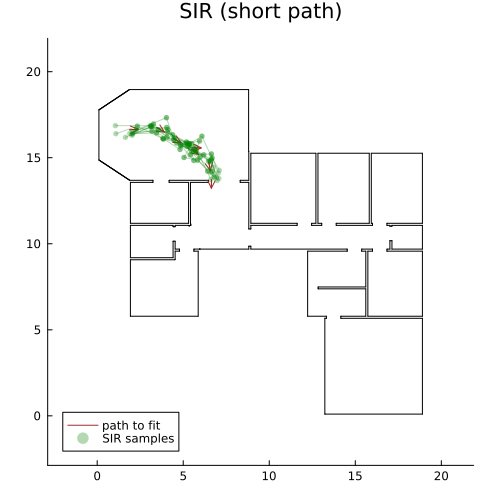

In [65]:
T_short = 6

N_samples = 10
N_SIR = 500
t1 = now()
traces = [sampling_importance_resampling(full_model, (T_short, full_model_args...), merged_constraints_low_deviation, N_SIR) for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (short path): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")

the_plot = frame_from_traces(world, "SIR (short path)", path_low_deviation[1:(T_short+1)], "path to fit", traces, "SIR samples")
savefig("imgs/SIR_short")
the_plot

There are still problems with SIR.  SIR already do not provide high-quality traces on short paths.  For longer paths, the difficulty only grows, as one blindly searches for a needle in a high-dimensional haystack.  And if the proposal $Q$ is unlikely to generate typical samples from the target $P$, one would need a massive number of particles to get a good approximation; in fact, the rate of convergence of SIR towards the target can be super-exponentially slow in $N \to \infty$!

Time elapsed per run (low dev): 1724.7 ms. (Total: 17247 ms.)


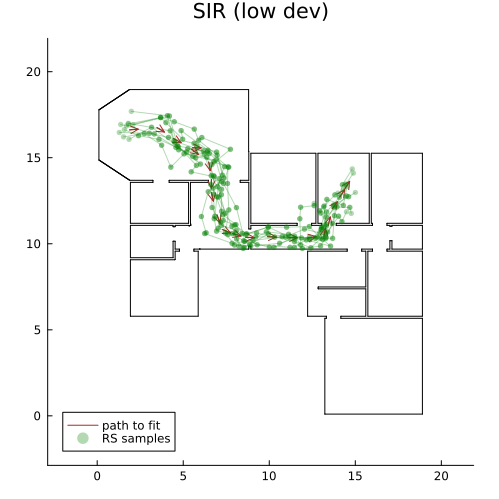

In [66]:
N_samples = 10
N_SIR = 500

t1 = now()
traces = [sampling_importance_resampling(full_model, (T, full_model_args...), merged_constraints_low_deviation, N_SIR) for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (low dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")

the_plot = frame_from_traces(world, "SIR (low dev)", path_low_deviation, "path to fit", traces, "RS samples")
savefig("imgs/SIR_final")
the_plot

## Sequential Monte Carlo (SMC) techniques

We now begin to exploit the structure of the problem in significant ways to construct good candidate traces for the posterior.  Especially, we use the Markov chain structure to construct these traces step-by-step.  While generic algorithms like SIR and rejection sampling must first construct full paths $\text{trace}_{0:T}$ and then sift among them using the observations $o_{0:T}$, we may instead generate one $\text{trace}_t$ at a time, taking into account the datum $o_t$.  Since then one is working with only a few dimensions any one time step, more intelligent searches become computationally feasible.

### Particle filter

Above, the function `importance_sample` produced a family of particles, each particle being `generate`d all in one go, together with the density of the observations relative to that path.

The following function `particle_filter` constructs an indistinguishable stochastic family of weighted particles, each trace built by `update`ing one timestep of path at a time, incorporating also the density of that timestep's observations.  (This comes at a small computational overhead: the static DSL combinator largely eliminates recomputation in performing the `update`s, but there is still extra logic, as well as the repeated allocations of the intermediary traces.)

In [67]:
# For this algorithm and each of its variants to come,
# we will present first a plain version of the code for clarity,
# followed by a logged version for display purposes.

function particle_filter(model, T, args, constraints, N_particles)
    traces = Vector{Trace}(undef, N_particles)
    log_weights = Vector{Float64}(undef, N_particles)
    
    for i in 1:N_particles
        traces[i], log_weights[i] = generate(model, (0, args...), constraints[1])
    end
    
    for t in 1:T
        for i in 1:N_particles
            traces[i], log_weight_increment, _, _ = update(traces[i], (t, args...), change_only_T, constraints[t+1])
            log_weights[i] += log_weight_increment
        end
    end

    return traces, log_weights
end

function particle_filter_infos(model, T, args, constraints, N_particles)
    traces = Vector{Trace}(undef, N_particles)
    log_weights = Vector{Float64}(undef, N_particles)
    vizs = Vector{NamedTuple}(undef, N_particles)
    infos = []
    
    for i in 1:N_particles
        traces[i], log_weights[i] = generate(model, (0, args...), constraints[1])
    end
    push!(infos, (type = :initialize, time = now(), label = "sample from start pose prior", traces = copy(traces), log_weights = copy(log_weights)))
    
    for t in 1:T
        for i in 1:N_particles
            traces[i], log_weight_increment, _, _ = update(traces[i], (t, args...), change_only_T, constraints[t+1])
            log_weights[i] += log_weight_increment
        end
        push!(infos, (type = :update, time = now(), label = "update to next step", traces = copy(traces), log_weights = copy(log_weights)))
    end

    return infos
end;

This refactoring is called a *particle filter* because it of how it spreads the reasoning out along the time axis.  It has the important effect of allowing the inference programmer to intervene, possibly modifying the particles at each time step.

Let's begin by picturing the step-by-step nature of SMC:

In [68]:
function frame_from_weighted_traces(world, title, path, path_label, traces, log_weights, trace_label; show_clutters=false, min_alpha=0.03)
    the_plot = plot_world(world, title; show_clutters=show_clutters)

    if !isnothing(path)
        plot!(path; label=path_label, color=:brown)
        plot!(path[get_args(traces[1])[1]+1]; label=nothing, color=:black)
    end

    norm_weights = exp.(log_weights .- logsumexp(log_weights))
    for (trace, weight) in zip(traces, norm_weights)
        alpha = max(min_alpha, 0.6*sqrt(weight))
        poses = get_path(trace)
        plot!([p.p[1] for p in poses], [p.p[2] for p in poses]; label=trace_label, color=:green, alpha=alpha)
        plot!(poses[end]; color=:green, alpha=alpha, label=nothing)       
        plot!([Segment(p1, p2) for (p1, p2) in zip(poses[1:end-1], poses[2:end])];
              label=nothing, color=:green, seriestype=:scatter, markersize=3, markerstrokewidth=0, alpha=alpha)
        trace_label = nothing
    end

    return the_plot
end

function frame_from_info(world, title, path, path_label, info, info_label; show_clutters=false, min_alpha=0.03)
    t = get_args(info.traces[1])[1]
    the_plot = frame_from_weighted_traces(world, title * "\nt=$t|" * info.label, path, path_label,
                    info.traces, info.log_weights, info_label; show_clutters=show_clutters, min_alpha=min_alpha)
    if haskey(info, :vizs)
        plot!(info.vizs[1].objs...; info.vizs[1].params...)
    end
    return the_plot
end;

┌ Info: Saved animation to /Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/pf_animation_low.gif
└ @ Plots /Users/sharlaon/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/pf_animation_low.gif")
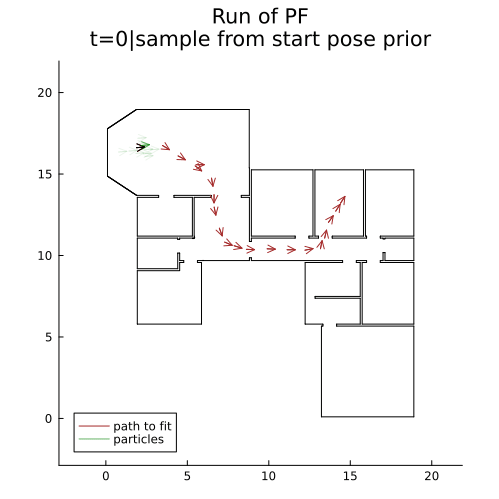

In [69]:
N_particles = 10
infos = particle_filter_infos(full_model, T, full_model_args, constraints_low_deviation, N_particles)

ani = Animation()
for info in infos
    frame_plot = frame_from_info(world, "Run of PF", path_low_deviation, "path to fit", info, "particles"; min_alpha=0.08)
    frame(ani, frame_plot)
end
gif(ani, "imgs/pf_animation_low.gif", fps=1)

┌ Info: Saved animation to /Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/pf_animation_high.gif
└ @ Plots /Users/sharlaon/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/Users/sharlaon/Library/CloudStorage/Dropbox/dev/probcomp-localization-tutorial/imgs/pf_animation_high.gif")
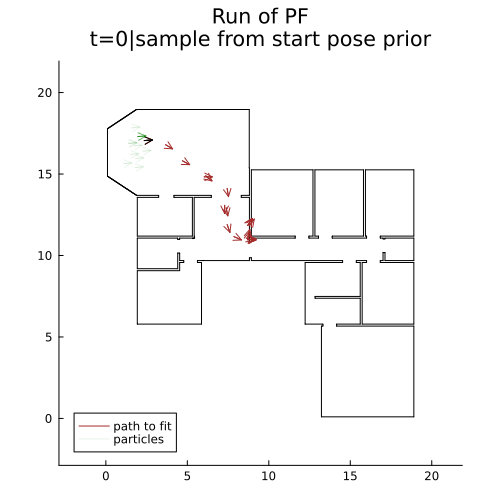

In [70]:
N_particles = 10
infos = particle_filter_infos(full_model, T, full_model_args, constraints_high_deviation, N_particles)

ani = Animation()
for info in infos
    frame_plot = frame_from_info(world, "Run of PF", path_high_deviation, "path to fit", info, "particles"; min_alpha=0.08)
    frame(ani, frame_plot)
end
gif(ani, "imgs/pf_animation_high.gif", fps=1)

### Bootstrap

One simple observation is that most of the partially proposed paths are clearly bad candidates from an early time.  We may intervene by pruning them out, say, replacing them with copies of the better ones before further exploration.  In other words, one can perform importance resampling on the particles in between the `update` steps.  The resulting kind of incremental SIR is often called a *bootstrap* in the literature.

In [71]:
function particle_filter_bootstrap(model, T, args, constraints, N_particles)
    traces = Vector{Trace}(undef, N_particles)
    log_weights = Vector{Float64}(undef, N_particles)
    
    for i in 1:N_particles
        traces[i], log_weights[i] = generate(model, (0, args...), constraints[1])
    end
    
    for t in 1:T
        traces, log_weights = resample(traces, log_weights)

        for i in 1:N_particles
            traces[i], log_weight_increment, _, _ = update(traces[i], (t, args...), change_only_T, constraints[t+1])
            log_weights[i] += log_weight_increment
        end
    end

    return traces, log_weights
end

function particle_filter_bootstrap_infos(model, T, args, constraints, N_particles)
    traces = Vector{Trace}(undef, N_particles)
    log_weights = Vector{Float64}(undef, N_particles)
    vizs = Vector{NamedTuple}(undef, N_particles)
    infos = []
    
    for i in 1:N_particles
        traces[i], log_weights[i] = generate(model, (0, args...), constraints[1])
    end
    push!(infos, (type = :initialize, time = now(), label = "sample from start pose prior", traces = copy(traces), log_weights = copy(log_weights)))
    
    for t in 1:T
        traces, log_weights = resample(traces, log_weights)
        push!(infos, (type = :resample, time = now(), label = "resample", traces = copy(traces), log_weights = copy(log_weights)))

        for i in 1:N_particles
            traces[i], log_weight_increment, _, _ = update(traces[i], (t, args...), change_only_T, constraints[t+1])
            log_weights[i] += log_weight_increment
        end
        push!(infos, (type = :update, time = now(), label = "update to next step", traces = copy(traces), log_weights = copy(log_weights)))
    end

    return infos
end;

Let's walk through the effect of resampling:

![](imgs_stable/bootstrap_with_code.gif)

Here is the aggregate behavior:

Time elapsed per run (low dev): 201.0 ms. (Total: 2010 ms.)


Time elapsed per run (high dev): 38.4 ms. (Total: 384 ms.)


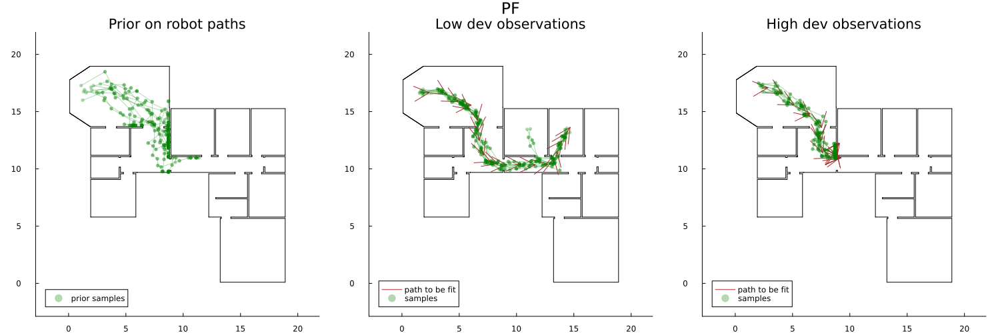

In [72]:
N_particles = 10

N_samples = 10

traces = [simulate(full_model, (T, full_model_args...)) for _ in 1:N_samples]
prior_plot = frame_from_traces(world, "Prior on robot paths", nothing, nothing, traces, "prior samples")

t1 = now()
traces = [sample(particle_filter_bootstrap(full_model, T, full_model_args, constraints_low_deviation, N_particles)...)[1] for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (low dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_low_deviation = frame_from_traces(world, "Low dev observations", path_low_deviation, "path to be fit", traces, "samples")

t1 = now()
traces = [sample(particle_filter_bootstrap(full_model, T, full_model_args, constraints_high_deviation, N_particles)...)[1] for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (high dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_high_deviation = frame_from_traces(world, "High dev observations", path_high_deviation, "path to be fit", traces, "samples")

the_plot = plot(prior_plot, posterior_plot_low_deviation, posterior_plot_high_deviation; size=(1500,500), layout=grid(1,3), plot_title="PF")
savefig("imgs/PF_1")
the_plot

### Rejuvenation

Two issues: particle diversity after resampling, and quality of these samples.

In [73]:
effective_sample_size(log_weights) =
    exp(-logsumexp(2. * (log_weights .- logsumexp(log_weights))))

resample_ESS(particles, log_weights, ESS_threshold; M=nothing) =
    (effective_sample_size(log_weights .- logsumexp(log_weights)) < ESS_threshold) ?
        resample(particles, log_weights; M=M) :
        (particles, log_weights)

function particle_filter_rejuv(model, T, args, constraints, N_particles, ESS_threshold, rejuv_kernel, rejuv_args_schedule)
    traces = Vector{Trace}(undef, N_particles)
    log_weights = Vector{Float64}(undef, N_particles)
    
    for i in 1:N_particles
        traces[i], log_weights[i] = generate(model, (0, args...), constraints[1])
    end

    for t in 1:T
        traces, log_weights = resample_ESS(traces, log_weights, ESS_threshold)

        for i in 1:N_particles
            for rejuv_args in rejuv_args_schedule
                traces[i], log_weights[i] = rejuv_kernel(traces[i], log_weights[i], rejuv_args)
            end
        end

        for i in 1:N_particles
            traces[i], log_weight_increment, _, _ = update(traces[i], (t, args...), change_only_T, constraints[t+1])
            log_weights[i] += log_weight_increment
        end
    end

    return traces, log_weights
end

function particle_filter_rejuv_infos(model, T, args, constraints, N_particles, ESS_threshold, rejuv_kernel, rejuv_args_schedule)
    traces = Vector{Trace}(undef, N_particles)
    log_weights = Vector{Float64}(undef, N_particles)
    vizs = Vector{NamedTuple}(undef, N_particles)
    infos = []
    
    for i in 1:N_particles
        traces[i], log_weights[i] = generate(model, (0, args...), constraints[1])
    end
    push!(infos, (type = :initialize, time = now(), label = "sample from start pose prior", traces = copy(traces), log_weights = copy(log_weights)))

    for t in 1:T
        traces, log_weights = resample_ESS(traces, log_weights, ESS_threshold)
        push!(infos, (type = :resample, time = now(), label = "resample", traces = copy(traces), log_weights = copy(log_weights)))

        for i in 1:N_particles
            for rejuv_args in rejuv_args_schedule
                traces[i], log_weights[i], vizs[i] = rejuv_kernel(traces[i], log_weights[i], rejuv_args)
            end
        end
        push!(infos, (type = :rejuvenate, time = now(), label = "rejuvenate", traces = copy(traces), log_weights = copy(log_weights), vizs = copy(vizs)))

        for i in 1:N_particles
            traces[i], log_weight_increment, _, _ = update(traces[i], (t, args...), change_only_T, constraints[t+1])
            log_weights[i] += log_weight_increment
        end
        push!(infos, (type = :update, time = now(), label = "update to next step", traces = copy(traces), log_weights = copy(log_weights)))
    end

    return infos
end;

### SMCP3 rejuvenation / grid search proposal

Takes the following shape:

In [74]:
function smcp3_step(particle, log_weight, fwd_proposal, bwd_proposal, proposal_args)
    _, fwd_proposal_weight, (fwd_model_update, bwd_proposal_choicemap, viz) = propose(fwd_proposal, (particle, proposal_args...))
    proposed_particle, model_weight_diff, _, _ = update(particle, fwd_model_update)
    bwd_proposal_weight, _ = assess(bwd_proposal, (proposed_particle, proposal_args...), bwd_proposal_choicemap)
    proposed_log_weight = log_weight + model_weight_diff + bwd_proposal_weight - fwd_proposal_weight
    return proposed_particle, proposed_log_weight, viz
end
smcp3_kernel(fwd_proposal, bwd_proposal) =
    (particle, log_weight, proposal_args) -> smcp3_step(particle, log_weight, fwd_proposal, bwd_proposal, proposal_args);

Let us write the forward and backward transformations for the grid proposal.

In [75]:
function vector_grid(center :: Vector{Float64}, grid_n_points :: Vector{Int}, grid_sizes :: Vector{Float64}) :: Vector{Vector{Float64}}
    offset = center .- (grid_n_points .+ 1) .* grid_sizes ./ 2.
    return reshape(map(I -> [Tuple(I)...] .* grid_sizes .+ offset, CartesianIndices(Tuple(grid_n_points))), (:,))
end

inverse_grid_index(grid_n_points :: Vector{Int}, j :: Int) :: Int =
    LinearIndices(Tuple(grid_n_points))[(grid_n_points .+ 1 .- [Tuple(CartesianIndices(Tuple(grid_n_points))[j])...])...]

# Sample from the posterior, restricted to the grid.
@gen function grid_fwd_proposal(trace, grid_n_points, grid_sizes)
    t = get_args(trace)[1]
    p = trace[prefix_address(t+1, :pose => :p)]
    hd = trace[prefix_address(t+1, :pose => :hd)]

    pose_grid = vector_grid([p[1], p[2], hd], grid_n_points, grid_sizes)
    choicemap_grid = [choicemap((prefix_address(t+1, :pose => :p), [x, y]),
                                (prefix_address(t+1, :pose => :hd), h))
                      for (x, y, h) in pose_grid]
    # Posterior densities, up to a common renormalization.
    pose_log_weights = [update(trace, cm)[2] for cm in choicemap_grid]
    pose_norm_weights = exp.(pose_log_weights .- logsumexp(pose_log_weights))

    fwd_j ~ categorical(pose_norm_weights)
    bwd_j = inverse_grid_index(grid_n_points, fwd_j)

    viz = (objs = ([Pose([x, y], h) for (x, y, h) in pose_grid],),
           params = (color=:red, label="pose grid"))

    return choicemap_grid[fwd_j], choicemap((:bwd_j, bwd_j)), viz
end

# Sample from the prior, restricted to the inverse grid.
@gen function grid_bwd_proposal(trace, grid_n_points, grid_sizes)
    t = get_args(trace)[1]
    p = trace[prefix_address(t+1, :pose => :p)]
    hd = trace[prefix_address(t+1, :pose => :hd)]

    pose_grid = vector_grid([p[1], p[2], hd], grid_n_points, grid_sizes)
    choicemap_grid = [choicemap((prefix_address(t+1, :pose => :p), [x, y]),
                                (prefix_address(t+1, :pose => :hd), h))
                      for (x, y, h) in pose_grid]
    # Prior densities.
    pose_log_weights = [project(update(trace, cm)[1], select(prefix_address(t+1, :pose)))
                        for cm in choicemap_grid]
    pose_norm_weights = exp.(pose_log_weights .- logsumexp(pose_log_weights))

    bwd_j ~ categorical(pose_norm_weights)
    fwd_j = inverse_grid_index(grid_n_points, bwd_j)

    return choicemap_grid[bwd_j], choicemap((:fwd_j, fwd_j))
end

grid_smcp3_kernel = smcp3_kernel(grid_fwd_proposal, grid_bwd_proposal);

# Sample from the prior, conditioned to the forward kernel sending it to the given trace.
@gen function grid_bwd_proposal_exact(trace, grid_n_points, grid_sizes)
    t = get_args(trace)[1]
    p = trace[prefix_address(t+1, :pose => :p)]
    hd = trace[prefix_address(t+1, :pose => :hd)]

    pose_grid = vector_grid([p[1], p[2], hd], grid_n_points, grid_sizes)
    choicemap_grid = [choicemap((prefix_address(t+1, :pose => :p), [x, y]),
                                (prefix_address(t+1, :pose => :hd), h))
                      for (x, y, h) in pose_grid]
    # Densities for the conditional distribution of inverse grid upon the information of the forward kernel.
    pose_log_weights = Vector{Float64}(undef, length(choicemap_grid))
    for (bwd_j, cm) in enumerate(choicemap_grid)
        bwd_trace, _, _, fwd_cm = update(trace, cm)
        pose_log_weights[bwd_j] =
            project(bwd_trace, select(prefix_address(t+1, :pose))) +
            assess(grid_fwd_proposal, (bwd_trace, grid_n_points, grid_sizes), choicemap((:fwd_j, inverse_grid_index(grid_n_points, bwd_j))))[1]
    end
    pose_norm_weights = exp.(pose_log_weights .- logsumexp(pose_log_weights))

    bwd_j ~ categorical(pose_norm_weights)
    fwd_j = inverse_grid_index(grid_n_points, bwd_j)

    return choicemap_grid[bwd_j], choicemap((:fwd_j, fwd_j))
end

grid_smcp3_kernel_exact = smcp3_kernel(grid_fwd_proposal, grid_bwd_proposal_exact);

Here is a visual on a run of the algorithm:

![](imgs_stable/smcp3_with_code.gif)

And here is the aggregate behavior:

Time elapsed per run (low dev): 8536.3 ms. (Total: 85363 ms.)


Time elapsed per run (high dev): 7924.0 ms. (Total: 79240 ms.)


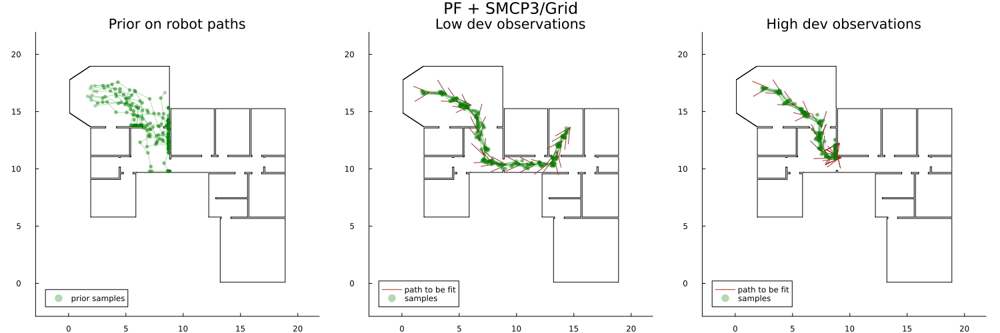

In [76]:
N_particles = 10
ESS_threshold =  1. + N_particles / 10.

grid_n_points_start = [3, 3, 3]
grid_sizes_start = [.7, .7, π/10]
grid_args_schedule = [(grid_n_points_start, grid_sizes_start .* (2/3)^(j-1)) for j=1:3]

traces = [simulate(full_model, (T, full_model_args...)) for _ in 1:N_samples]
prior_plot = frame_from_traces(world, "Prior on robot paths", nothing, nothing, traces, "prior samples")

t1 = now()
traces = [sample(particle_filter_rejuv(full_model, T, full_model_args, constraints_low_deviation, N_particles, ESS_threshold, grid_smcp3_kernel, grid_args_schedule)...)[1] for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (low dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_low_deviation = frame_from_traces(world, "Low dev observations", path_low_deviation, "path to be fit", traces, "samples")

t1 = now()
traces = [sample(particle_filter_rejuv(full_model, T, full_model_args, constraints_high_deviation, N_particles, ESS_threshold, grid_smcp3_kernel, grid_args_schedule)...)[1] for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (high dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_high_deviation = frame_from_traces(world, "High dev observations", path_high_deviation, "path to be fit", traces, "samples")

the_plot = plot(prior_plot, posterior_plot_low_deviation, posterior_plot_high_deviation; size=(1500,500), layout=grid(1,3), plot_title="PF + SMCP3/Grid")
savefig("imgs/PF_SMCP3_grid")
the_plot

The speed of this approach is already perhaps an issue.

In [77]:
# While the above code runs a fast but less mathematically precise backwards proposal,
# the following code runs the mathematically locally optimal backwards proposal.
# It turns out this backwards proposal is ~15x slower, without discernably better
# results, as you can see for yourself if you choose to uncomment, run, and compare it.

# N_particles = 10
# ESS_threshold =  1. + N_particles / 10.

# grid_n_points_start = [3, 3, 3]
# grid_sizes_start = [.7, .7, π/10]
# grid_args_schedule = [(grid_n_points_start, grid_sizes_start .* (2/3)^(j-1)) for j=1:3]

# traces = [simulate(full_model, (T, full_model_args...)) for _ in 1:N_samples]
# prior_plot = frame_from_traces(world, "Prior on robot paths", nothing, nothing, traces, "prior samples")

# t1 = now()
# traces = [sample(particle_filter_rejuv(full_model, T, full_model_args, constraints_low_deviation, N_particles, ESS_threshold, grid_smcp3_kernel_exact, grid_args_schedule)...)[1] for _ in 1:N_samples]
# t2 = now()
# println("Time elapsed per run (low dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
# posterior_plot_low_deviation = frame_from_traces(world, "Low dev observations", path_low_deviation, "path to be fit", traces, "samples")

# t1 = now()
# traces = [sample(particle_filter_rejuv(full_model, T, full_model_args, constraints_high_deviation, N_particles, ESS_threshold, grid_smcp3_kernel_exact, grid_args_schedule)...)[1] for _ in 1:N_samples]
# t2 = now()
# println("Time elapsed per run (high dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
# posterior_plot_high_deviation = frame_from_traces(world, "High dev observations", path_high_deviation, "path to be fit", traces, "samples")

# the_plot = plot(prior_plot, posterior_plot_low_deviation, posterior_plot_high_deviation; size=(1500,500), layout=grid(1,3), plot_title="PF + SMCP3/Grid")
# savefig("imgs/PF_SMCP3_grid_2")
# the_plot

### Adaptive inference controller

For a low deviation path, a particle filter with mere resampling performed decent inference: the MCMC rejuvenation is overkill!  The issue was when the path deviation is higher.

We, the inference programmers, do not have to be stuck here; we get to choose how much computing resource to spend on any given example.  For example, we can check a quantitative test for our particle population's suitabiliy as hypotheses, such as a marginal likelihood estimate, and only do as much work is needed to bring this measure to target.

In [78]:
function controlled_particle_filter_rejuv(model, T, args, constraints, N_particles, ESS_threshold, rejuv_kernel, rejuv_args_schedule, weight_change_bound, args_schedule_modifier;
    MAX_rejuv=3)
    traces = Vector{Trace}(undef, N_particles)
    log_weights = Vector{Float64}(undef, N_particles)

    prev_total_weight = 0.
    for i in 1:N_particles
        traces[i], log_weights[i] = generate(model, (0, args...), constraints[1])
    end

    for t in 1:T
        traces, log_weights = resample_ESS(traces, log_weights, ESS_threshold)

        rejuv_count = 0
        temp_args_schedule = rejuv_args_schedule
        while logsumexp(log_weights) - prev_total_weight < weight_change_bound && rejuv_count <= MAX_rejuv
            for i in 1:N_particles
                for rejuv_args in rejuv_args_schedule
                    traces[i], log_weights[i] = rejuv_kernel(traces[i], log_weights[i], rejuv_args)
                end
            end

            if logsumexp(log_weights) - prev_total_weight < weight_change_bound && rejuv_count != MAX_rejuv && t > 1
                # Produce entirely new extensions to the last time step by first backing out and then readvancing.
                for i in 1:N_particles
                    traces[i], log_weight_increment, _, _ = update(traces[i], (t-2, args...), change_only_T, choicemap())
                    log_weights[i] += log_weight_increment
                end
                for i in 1:N_particles
                    traces[i], log_weight_increment, _, _ = update(traces[i], (t-1, args...), change_only_T, constraints[t])
                    log_weights[i] += log_weight_increment
                end

                # By the way, the following commented lines would accomplish the same (on traces, not infos) as the above two loops.
                # for i in 1:N_particles
                #     traces[i], log_weight_increment, _, _ = regenerate(traces[i], select(prefix_address(t-1, :pose)))
                #     log_weights[i] += log_weight_increment
                # end

                traces, weights = resample_ESS(traces, log_weights, ESS_threshold)
            end

            rejuv_count += 1
            temp_args_schedule = args_schedule_modifier(temp_args_schedule, rejuv_count)
        end

        prev_total_weight = logsumexp(log_weights)
        for i in 1:N_particles
            traces[i], log_weight_increment, _, _ = update(traces[i], (t, args...), change_only_T, constraints[t+1])
            log_weights[i] += log_weight_increment
        end
    end

    return traces, log_weights
end

function controlled_particle_filter_rejuv_infos(model, T, args, constraints, N_particles, ESS_threshold, rejuv_kernel, rejuv_args_schedule, weight_change_bound, args_schedule_modifier;
                                                MAX_rejuv=3)
    traces = Vector{Trace}(undef, N_particles)
    log_weights = Vector{Float64}(undef, N_particles)
    vizs = Vector{NamedTuple}(undef, N_particles)
    infos = []

    prev_total_weight = 0.
    for i in 1:N_particles
        traces[i], log_weights[i] = generate(model, (0, args...), constraints[1])
    end
    push!(infos, (type = :initialize, time = now(), label = "sample from start pose prior", traces = copy(traces), log_weights = copy(log_weights)))

    for t in 1:T
        traces, log_weights = resample_ESS(traces, log_weights, ESS_threshold)
        push!(infos, (type = :resample, time = now(), label = "resample", traces = copy(traces), log_weights = copy(log_weights)))

        rejuv_count = 0
        temp_args_schedule = rejuv_args_schedule
        while logsumexp(log_weights) - prev_total_weight < weight_change_bound && rejuv_count <= MAX_rejuv
            for i in 1:N_particles
                for rejuv_args in rejuv_args_schedule
                    traces[i], log_weights[i], vizs[i] = rejuv_kernel(traces[i], log_weights[i], rejuv_args)
                end
            end
            push!(infos, (type = :rejuvenate, time=now(), label = "rejuvenate", traces = copy(traces), log_weights = copy(log_weights), vizs = copy(vizs)))

            if logsumexp(log_weights) - prev_total_weight < weight_change_bound && rejuv_count != MAX_rejuv && t > 1
                # Produce entirely new extensions to the last time step by first backing out and then readvancing.
                for i in 1:N_particles
                    traces[i], log_weight_increment, _, _ = update(traces[i], (t-2, args...), change_only_T, choicemap())
                    log_weights[i] += log_weight_increment
                end
                push!(infos, (type = :regenernate_bwd, time=now(), label = "roll back", traces = copy(traces), log_weights = copy(log_weights)))
                for i in 1:N_particles
                    traces[i], log_weight_increment, _, _ = update(traces[i], (t-1, args...), change_only_T, constraints[t])
                    log_weights[i] += log_weight_increment
                end
                push!(infos, (type = :regenernate_fwd, time=now(), label = "fwd again", traces = copy(traces), log_weights = copy(log_weights)))

                # By the way, the following commented lines would accomplish the same (on traces, not infos) as the above two loops.
                # for i in 1:N_particles
                #     traces[i], log_weight_increment, _, _ = regenerate(traces[i], select(prefix_address(t-1, :pose)))
                #     log_weights[i] += log_weight_increment
                # end
                # push!(infos, (type = :regenerate, label = "regenernate", traces = copy(traces), log_weights = copy(log_weights)))

                traces, weights = resample_ESS(traces, log_weights, ESS_threshold)
                push!(infos, (type = :resample2, time=now(), label = "resample", traces = copy(traces), log_weights = copy(log_weights)))
            end

            rejuv_count += 1
            temp_args_schedule = args_schedule_modifier(temp_args_schedule, rejuv_count)
        end

        prev_total_weight = logsumexp(log_weights)
        for i in 1:N_particles
            traces[i], log_weight_increment, _, _ = update(traces[i], (t, args...), change_only_T, constraints[t+1])
            log_weights[i] += log_weight_increment
        end
        push!(infos, (type = :update, time=now(), label = "update to next step", traces = copy(traces), log_weights = copy(log_weights)))
    end

    return infos
end;

Here is a stepping through:

![](imgs_stable/controlled_smcp3_with_code.gif)

Time elapsed per run (low dev): 962.9 ms. (Total: 9629 ms.)


Time elapsed per run (high dev): 76.4 ms. (Total: 764 ms.)


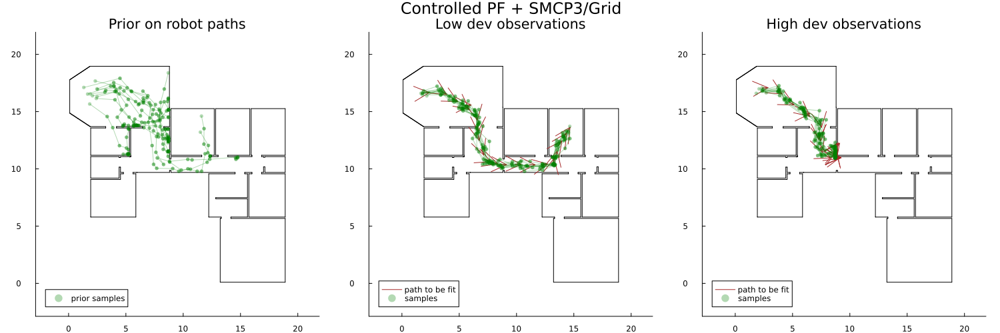

In [79]:
N_particles = 10
ESS_threshold =  1. + N_particles / 10.
weight_change_bound = (-1. * 10^5)/20

grid_n_points_start = [3, 3, 3]
grid_sizes_start = [.7, .7, π/10]
grid_args_schedule = [(grid_n_points_start, grid_sizes_start .* (2/3)^(j-1)) for j=1:3]

grid_args_schedule_modifier(args_schedule, rejuv_count) =
    (rejuv_count % 1 == 0) ?
        [(nsteps, sizes .* 0.75) for (nsteps, sizes) in args_schedule] :
        [(nsteps + 2, sizes)     for (nsteps, sizes) in args_schedule];

traces = [simulate(full_model, (T, full_model_args...)) for _ in 1:N_samples]
prior_plot = frame_from_traces(world, "Prior on robot paths", nothing, nothing, traces, "prior samples")

t1 = now()
traces = [sample(controlled_particle_filter_rejuv(full_model, T, full_model_args, constraints_low_deviation, N_particles, ESS_threshold, grid_smcp3_kernel, grid_args_schedule, weight_change_bound, grid_args_schedule_modifier)...)[1] for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (low dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_low_deviation = frame_from_traces(world, "Low dev observations", path_low_deviation, "path to be fit", traces, "samples")

t1 = now()
traces = [sample(controlled_particle_filter_rejuv(full_model, T, full_model_args, constraints_high_deviation, N_particles, ESS_threshold, grid_smcp3_kernel, grid_args_schedule, weight_change_bound, grid_args_schedule_modifier)...)[1] for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (high dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_high_deviation = frame_from_traces(world, "High dev observations", path_high_deviation, "path to be fit", traces, "samples")

the_plot = plot(prior_plot, posterior_plot_low_deviation, posterior_plot_high_deviation; size=(1500,500), layout=grid(1,3), plot_title="Controlled PF + SMCP3/Grid")
savefig("imgs/PF_controller")
the_plot

### MCMC rejuvenation / Gaussian drift proposal

A faster rejuvenation strategy than a grid search is to simply giggle the point.

This proposal is fast enough that we need not use the inference controller.

In [80]:
@gen function drift_fwd_proposal(trace, drift_factor)
    t = get_args(trace)[1]
    p_noise = get_args(trace)[4].motion_settings.p_noise
    hd_noise = get_args(trace)[4].motion_settings.hd_noise

    undrift_p = trace[prefix_address(t+1, :pose => :p)]
    undrift_hd = trace[prefix_address(t+1, :pose => :hd)]

    drift_p ~ mvnormal(undrift_p, (drift_factor * p_noise)^2 * [1 0 ; 0 1])
    drift_hd ~ normal(undrift_hd, drift_factor * hd_noise)

    std_devs_radius = 2.
    viz = (objs = ([undrift_p[1]], [undrift_p[2]]),
           params = (color=:red, label="$(round(std_devs_radius, digits=2))σ region", seriestype=:scatter,
                     markersize=(20. * std_devs_radius * p_noise), markerstrokewidth=0, alpha=0.25))

    return choicemap((prefix_address(t+1, :pose => :p), drift_p), (prefix_address(t+1, :pose => :hd), drift_hd)),
           choicemap((:undrift_p, undrift_p), (:undrift_hd, undrift_hd)),
           viz
end

@gen function drift_bwd_proposal(trace, drift_factor)
    t = get_args(trace)[1]
    p_noise = get_args(trace)[4].motion_settings.p_noise
    hd_noise = get_args(trace)[4].motion_settings.hd_noise

    if t == 0
       start_pose = get_args(trace)[2].start
       noiseless_p = start_pose.p
       noiseless_hd = start_pose.hd
    else
       prev_pose = trace[prefix_address(t, :pose)]
       prev_control = get_args(trace)[2].controls[t]
       noiseless_p = prev_pose.p + prev_control.ds * prev_pose.dp
       noiseless_hd = prev_pose.hd + prev_control.dhd
    end

    drift_p = trace[prefix_address(t+1, :pose => :p)]
    drift_hd = trace[prefix_address(t+1, :pose => :hd)]

    # Optimal choice of `undrift_pose` is obtained from conditioning the motion model that noises `noiseless_pose` upon
    # the information that the forward drift then further moved it to `drift_pose`.
    # In this case there is a closed form, which happens to be a Gaussian drift with some other parameters.
    e = 1/drift_factor^2
    undrift_p ~ mvnormal((noiseless_p + e * drift_p)/(1+e), p_noise^2/(1+e) * [1 0 ; 0 1])
    undrift_hd ~ normal((noiseless_hd + e * drift_hd)/(1+e), hd_noise/sqrt(1+e))

    return choicemap((prefix_address(t+1, :pose => :p), undrift_p), (prefix_address(t+1, :pose => :hd), undrift_hd)),
           choicemap((:drift_p, drift_p), (:drift_hd, drift_hd))
end

drift_smcp3_kernel = smcp3_kernel(drift_fwd_proposal, drift_bwd_proposal);

A fair criticism is that this forward proposal in no way improves the samples; it only jiggles them.  So, on its own, the resulting algorithm is little different from the bootstrap on the original motion model with a higher motion noise parameter.

Time elapsed per run (low dev): 220.4 ms. (Total: 2204 ms.)


Time elapsed per run (high dev): 189.6 ms. (Total: 1896 ms.)


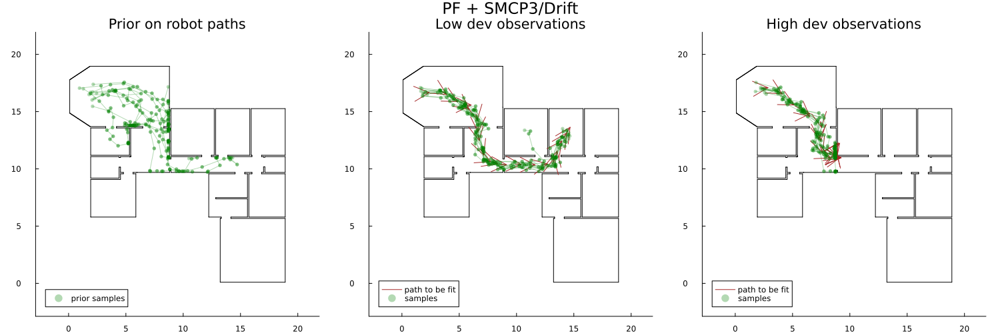

In [81]:
N_particles = 10
ESS_threshold =  1. + N_particles / 10.

drift_factor = 1/3
drift_args_schedule = [drift_factor^j for j=1:3]

traces = [simulate(full_model, (T, full_model_args...)) for _ in 1:N_samples]
prior_plot = frame_from_traces(world, "Prior on robot paths", nothing, nothing, traces, "prior samples")

t1 = now()
traces = [sample(particle_filter_rejuv(full_model, T, full_model_args, constraints_low_deviation, N_particles, ESS_threshold, drift_smcp3_kernel, drift_args_schedule)...)[1] for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (low dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_low_deviation = frame_from_traces(world, "Low dev observations", path_low_deviation, "path to be fit", traces, "samples")

t1 = now()
traces = [sample(particle_filter_rejuv(full_model, T, full_model_args, constraints_high_deviation, N_particles, ESS_threshold, drift_smcp3_kernel, drift_args_schedule)...)[1] for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (high dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_high_deviation = frame_from_traces(world, "High dev observations", path_high_deviation, "path to be fit", traces, "samples")

the_plot = plot(prior_plot, posterior_plot_low_deviation, posterior_plot_high_deviation; size=(1500,500), layout=grid(1,3), plot_title="PF + SMCP3/Drift")
savefig("imgs/PF_SMCP3_drift")
the_plot

We can compromise between the grid search and giggling.  The idea is to perform a mere two-element search that compares the given point with the random one, or rather to resample from the pair.  This would have a chance of improving sample quality, without spending much time searching for the improvement.

The resulting algorithm is conventionally called "MCMC rejuvenation", and our strategy to resample between the pair amounts to the "Boltzmann acceptance rule".  A even more common acceptance rule that slightly biases in favor of the jiggled sample is called the "Metropolis–Hastings acceptance rule".

In [82]:
function mcmc_step(particle, log_weight, mcmc_proposal, mcmc_args, mcmc_rule)
    proposed_particle, proposed_log_weight, viz = mcmc_proposal(particle, log_weight, mcmc_args)
    return mcmc_rule([particle, proposed_particle], [log_weight, proposed_log_weight])..., viz
end
mcmc_kernel(mcmc_proposal, mcmc_rule) =
    (particle, log_weight, mcmc_args) -> mcmc_step(particle, log_weight, mcmc_proposal, mcmc_args, mcmc_rule)

boltzmann_rule = sample

# Assumes `particles` is ordered so that first item is the original and second item is the proposed.
# Notes:
# * If the proposed item has higher weight, it is accepted unconditionally.  There is an overall bias.
# * In all cases, the weight is unchanged.
function mh_rule(particles, log_weights)
    @assert length(particles) == length(log_weights) == 2
    acceptance_ratio = min(1., exp(log_weights[2] - log_weights[1]))
    return (bernoulli(acceptance_ratio) ? particles[2] : particles[1]), log_weights[1]
end;

In [83]:
drift_boltzmann_kernel = mcmc_kernel(drift_smcp3_kernel, boltzmann_rule)
drift_mh_kernel = mcmc_kernel(drift_smcp3_kernel, mh_rule);

Time elapsed per run (low dev): 198.8 ms. (Total: 1988 ms.)


Time elapsed per run (high dev): 200.6 ms. (Total: 2006 ms.)


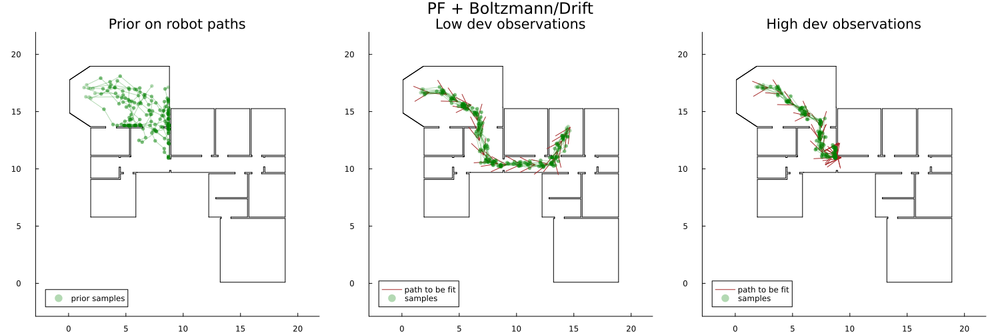

In [84]:
N_particles = 10
ESS_threshold =  1. + N_particles / 10.

drift_factor = 1/3
drift_args_schedule = [drift_factor^j for j=1:3]

traces = [simulate(full_model, (T, full_model_args...)) for _ in 1:N_samples]
prior_plot = frame_from_traces(world, "Prior on robot paths", nothing, nothing, traces, "prior samples")

t1 = now()
traces = [sample(particle_filter_rejuv(full_model, T, full_model_args, constraints_low_deviation, N_particles, ESS_threshold, drift_boltzmann_kernel, drift_args_schedule)...)[1] for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (low dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_low_deviation = frame_from_traces(world, "Low dev observations", path_low_deviation, "path to be fit", traces, "samples")

t1 = now()
traces = [sample(particle_filter_rejuv(full_model, T, full_model_args, constraints_high_deviation, N_particles, ESS_threshold, drift_boltzmann_kernel, drift_args_schedule)...)[1] for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (high dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_high_deviation = frame_from_traces(world, "High dev observations", path_high_deviation, "path to be fit", traces, "samples")

the_plot = plot(prior_plot, posterior_plot_low_deviation, posterior_plot_high_deviation; size=(1500,500), layout=grid(1,3), plot_title="PF + Boltzmann/Drift")
savefig("imgs/PF_boltzmann_drift")
the_plot

Time elapsed per run (low dev): 203.3 ms. (Total: 2033 ms.)


Time elapsed per run (high dev): 202.0 ms. (Total: 2020 ms.)


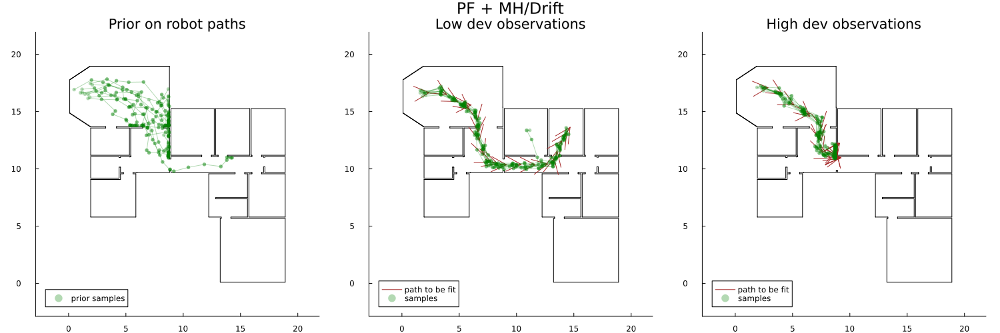

In [85]:
N_particles = 10
ESS_threshold =  1. + N_particles / 10.

drift_factor = 1/3
drift_args_schedule = [drift_factor^j for j=1:3]

traces = [simulate(full_model, (T, full_model_args...)) for _ in 1:N_samples]
prior_plot = frame_from_traces(world, "Prior on robot paths", nothing, nothing, traces, "prior samples")

t1 = now()
traces = [sample(particle_filter_rejuv(full_model, T, full_model_args, constraints_low_deviation, N_particles, ESS_threshold, drift_mh_kernel, drift_args_schedule)...)[1] for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (low dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_low_deviation = frame_from_traces(world, "Low dev observations", path_low_deviation, "path to be fit", traces, "samples")

t1 = now()
traces = [sample(particle_filter_rejuv(full_model, T, full_model_args, constraints_high_deviation, N_particles, ESS_threshold, drift_mh_kernel, drift_args_schedule)...)[1] for _ in 1:N_samples]
t2 = now()
println("Time elapsed per run (high dev): $(value(t2 - t1) / N_samples) ms. (Total: $(value(t2 - t1)) ms.)")
posterior_plot_high_deviation = frame_from_traces(world, "High dev observations", path_high_deviation, "path to be fit", traces, "samples")

the_plot = plot(prior_plot, posterior_plot_low_deviation, posterior_plot_high_deviation; size=(1500,500), layout=grid(1,3), plot_title="PF + MH/Drift")
savefig("imgs/PF_mh_drift")
the_plot